# Gaussian Processes for Yield Prediction - Potato

As standard bayesian models, we will use Gaussian Processes to fit a function that calculates Yield crop

In [1]:
import numpy as np
import pandas as pd
import pymc3 as pm
import arviz as az
import geopandas as gpd
import matplotlib.pyplot as plt

import pickle

from shapely.geometry import Point
from sklearn.metrics import mean_absolute_error, r2_score

%reload_ext autoreload
%autoreload 2

from utils import *
from gaussian_processes import GaussianProcess

az.style.use('arviz-whitegrid')

WARNING (theano.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [2]:
# Set random seed
np.random.seed(42)

## Load and build the dataset

For simplicity, we start with only 2 features, the most relevant according to the linear regression model

In [3]:
# Load the dataset
cy = pd.read_csv('data/yield_processed.csv', index_col=0)
cy = cy[cy['Item'] == 'Potatoes'].drop(columns='Item').reset_index(drop=True)
cy

,Area,hg/ha_yield,avg_rain_mm_per_year,pesticides_kg_per_ha,avg_temp,lat,lon,elev
0,Albania,153105.043478,1485.0,2.184838,16.326957,41.0,20.0,708.0
1,Algeria,182413.956522,89.0,1.110530,17.488261,28.0,3.0,800.0
2,Angola,59085.739130,1010.0,0.027360,24.303043,-12.5,18.5,1112.0
3,Argentina,262059.173913,591.0,2.488804,17.708478,-34.0,-64.0,595.0
4,Armenia,151076.904762,562.0,0.493300,9.580952,40.0,45.0,1792.0
...,...,...,...,...,...,...,...,...
90,Ukraine,125038.857143,565.0,2.121930,8.413333,49.0,32.0,175.0
91,United Kingdom,406131.695652,1220.0,6.246453,9.602783,54.0,-2.0,75.0
92,Uruguay,146737.043478,1300.0,6.608791,16.980870,-33.0,-56.0,109.0
93,Zambia,115800.652174,1020.0,1.066569,21.064783,-15.0,30.0,1138.0


Remove less relevant features according to the linear model

In [4]:
cy = cy.drop('lat', axis=1)
cy = cy.drop('lon', axis=1)
cy = cy.drop('elev', axis=1)
cy

,Area,hg/ha_yield,avg_rain_mm_per_year,pesticides_kg_per_ha,avg_temp
0,Albania,153105.043478,1485.0,2.184838,16.326957
1,Algeria,182413.956522,89.0,1.110530,17.488261
2,Angola,59085.739130,1010.0,0.027360,24.303043
3,Argentina,262059.173913,591.0,2.488804,17.708478
4,Armenia,151076.904762,562.0,0.493300,9.580952
...,...,...,...,...,...
90,Ukraine,125038.857143,565.0,2.121930,8.413333
91,United Kingdom,406131.695652,1220.0,6.246453,9.602783
92,Uruguay,146737.043478,1300.0,6.608791,16.980870
93,Zambia,115800.652174,1020.0,1.066569,21.064783


Get geodata for plot world map

In [5]:
countries = cy['Area'].unique()
world = get_geodata(countries)

# Get the features and the target feature
cy = cy.drop('Area', axis=1)
print(cy.describe())
x_data = cy.drop('hg/ha_yield', axis=1).to_numpy()
y_data = cy['hg/ha_yield'].to_numpy()

# Set the indices of the sample for testing
num_test_results = 10
test_indices = np.random.choice(len(y_data), size=num_test_results, replace=False)
test_indices = np.sort(test_indices)
train_indices = np.array([i for i in range(len(y_data)) if i not in test_indices])
x_test_data, y_test_data = x_data[test_indices], y_data[test_indices]

         hg/ha_yield  avg_rain_mm_per_year  pesticides_kg_per_ha   avg_temp
count      95.000000             95.000000             95.000000  95.000000
mean   181841.413334           1019.326316              3.143013  17.850083
std     96668.731420            696.800613              4.049940   7.388661
min     20516.217391             51.000000              0.003028   3.459565
25%    127517.738095            577.000000              0.217843  10.646667
50%    160965.434783            788.000000              1.590888  18.163478
75%    224914.108696           1492.500000              4.085821  24.843652
max    448891.538462           3240.000000             20.888427  29.718696


Standardize the data

In [6]:
x_std_data, x_mean, x_stddev = standardize_data(x_data)
y_std_data, y_mean, y_stddev = standardize_data(y_data)

n_samples, n_features = x_std_data.shape

In [7]:
results = {}

## First model

Let's start with the most used kernel, the **Exponential Quadratic**

$$
\phi(x,x') = \exp \left( -\frac{||x-x'||^2}{2\ell^2} \right)
$$

In [8]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.ExpQuad(n_features, ls) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [9]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=8_000, tune=4_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, ls]


Sampling 2 chains for 4_000 tune and 8_000 draw iterations (8_000 + 16_000 draws total) took 334 seconds.


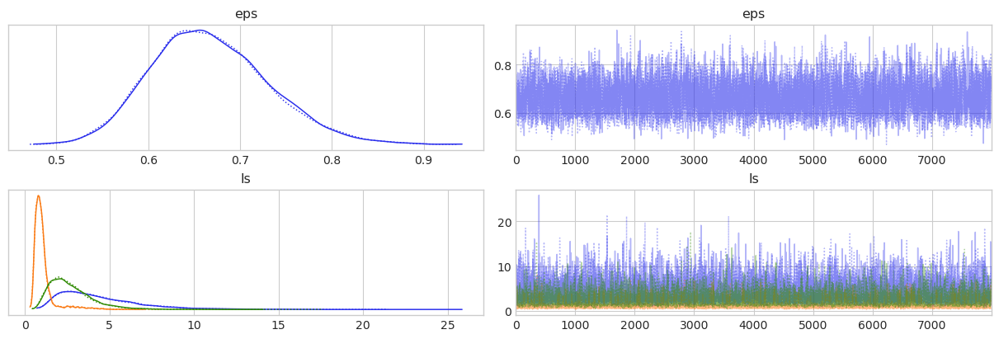

In [10]:
plot_trace(trace, ['eps', 'ls'])

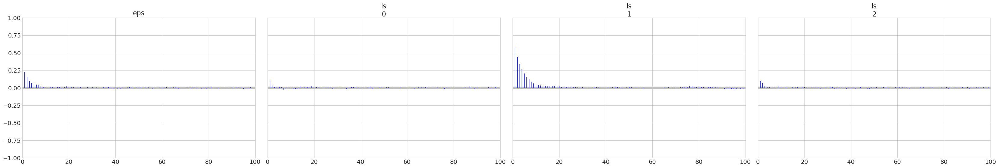

In [11]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [13]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

C:\Users\pasqu\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


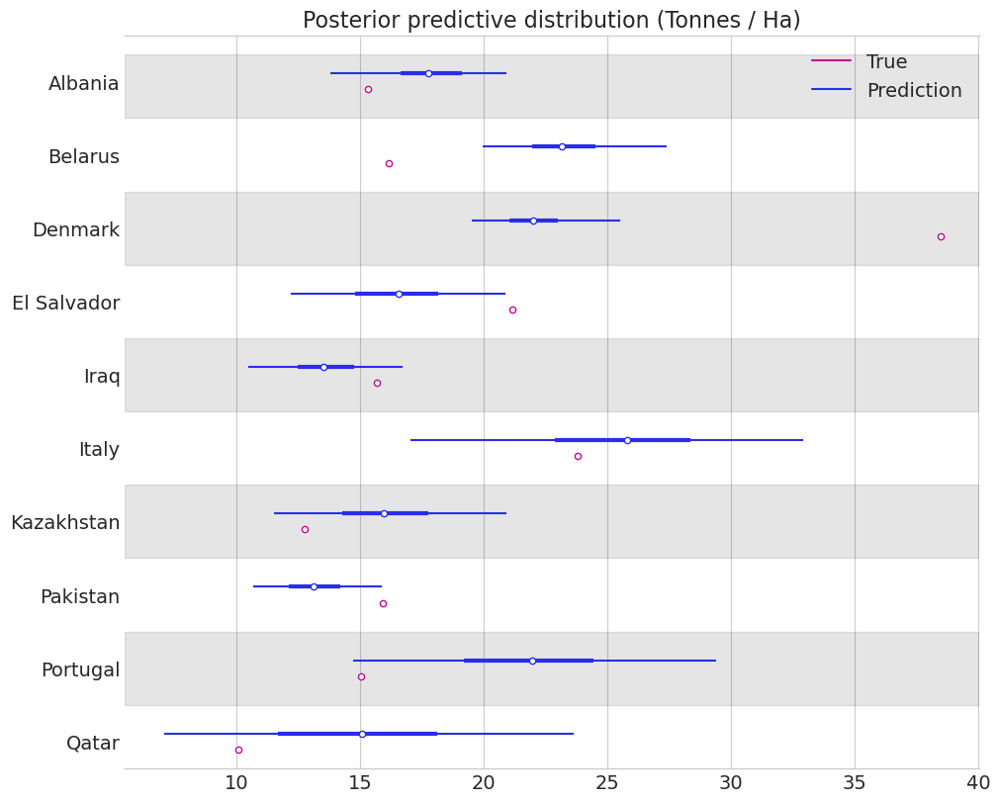

In [14]:
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices])

[]

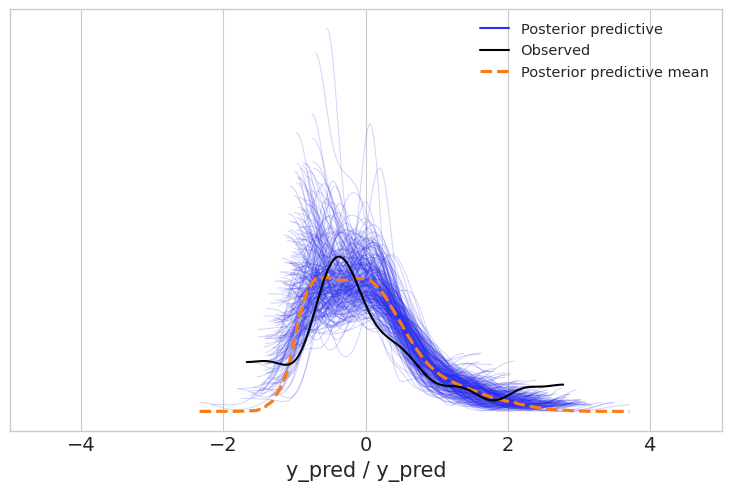

In [15]:
ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
ax = az.plot_ppc(ppc_data, num_pp_samples=256)
ax.set_xlim((-5, 5))
plt.plot()

In [16]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data)

R2 : 0.6345848849562421
MAE: 47047.30554743862


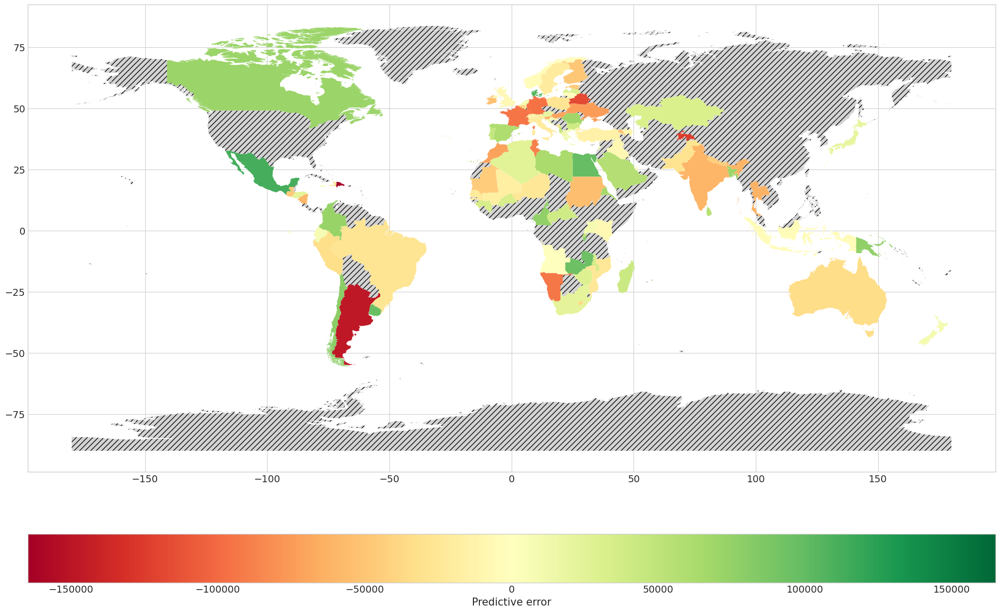

In [17]:
world_error_plot(world, pred_samples, y_mean, y_stddev, y_data)

In [18]:
results['expquad1'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

### More samples
Let's get more samples in order to check if we would need more

In [19]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.ExpQuad(n_features, ls) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [20]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, ls]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 649 seconds.


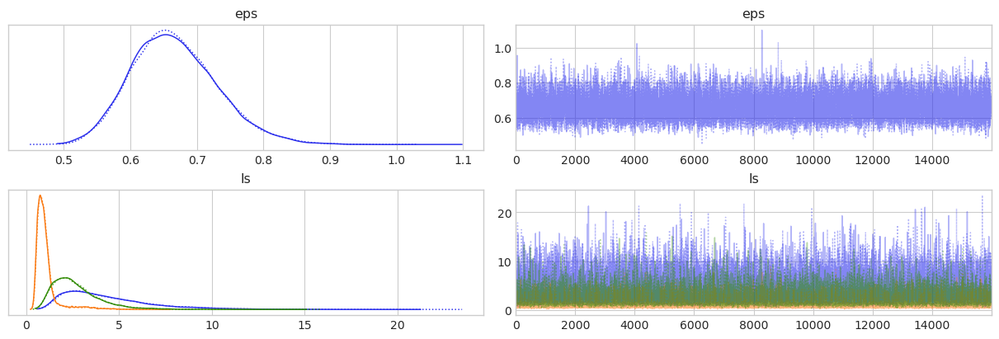

In [21]:
plot_trace(trace, ['eps', 'ls'])

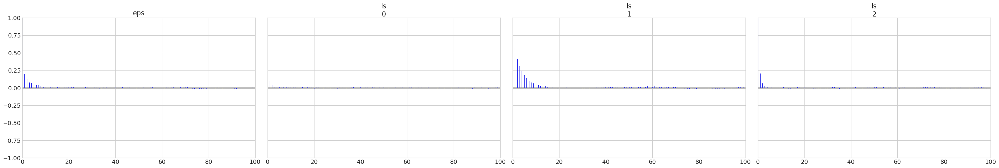

In [22]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [23]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

C:\Users\pasqu\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


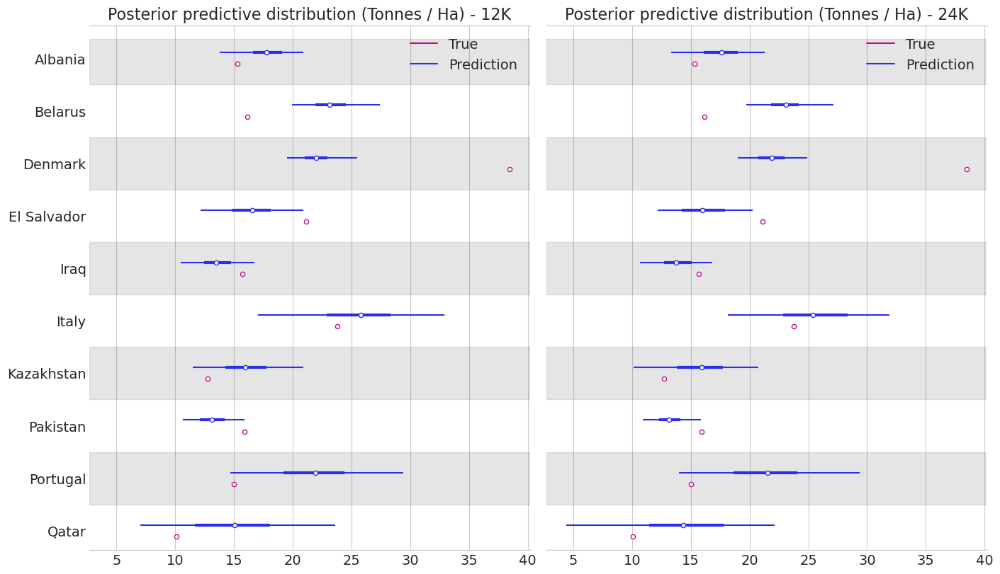

In [24]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['expquad1']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='Posterior predictive distribution (Tonnes / Ha) - 12K')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='Posterior predictive distribution (Tonnes / Ha) - 24K')
plt.show()

[]

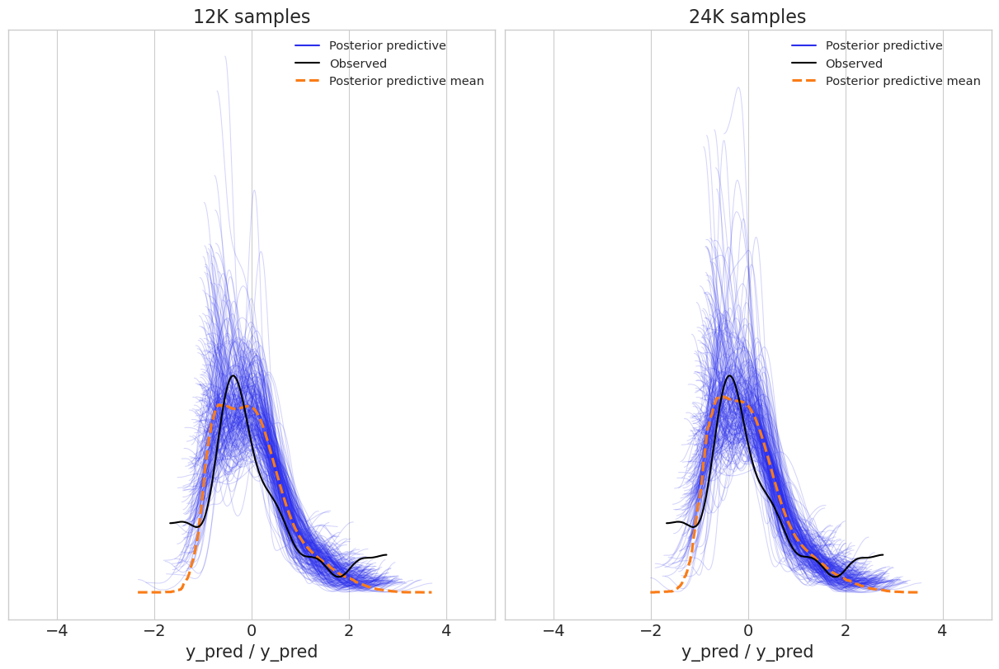

In [25]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 8), sharex=True, sharey=True)
ax1.set_title('12K samples')
ax2.set_title('24K samples')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred': results['expquad1']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax2)
ax2.set_xlim((-5, 5))
plt.plot()

In [26]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data, show=False)
print("R2  12K: {} \t MAE 12K: {}".format(results['expquad1']['r2'], results['expquad1']['mae']))
print("R2  24K: {} \t MAE 24K: {}".format(r2, mae))

R2  12K: 0.6345848849562421 	 MAE 12K: 47047.30554743862
R2  24K: 0.6339344819346913 	 MAE 24K: 47012.899766683666


In [27]:
results['expquad2'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

### More more samples

In [29]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.ExpQuad(n_features, ls) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [30]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=32_000, tune=16_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, ls]


Sampling 2 chains for 16_000 tune and 32_000 draw iterations (32_000 + 64_000 draws total) took 1209 seconds.


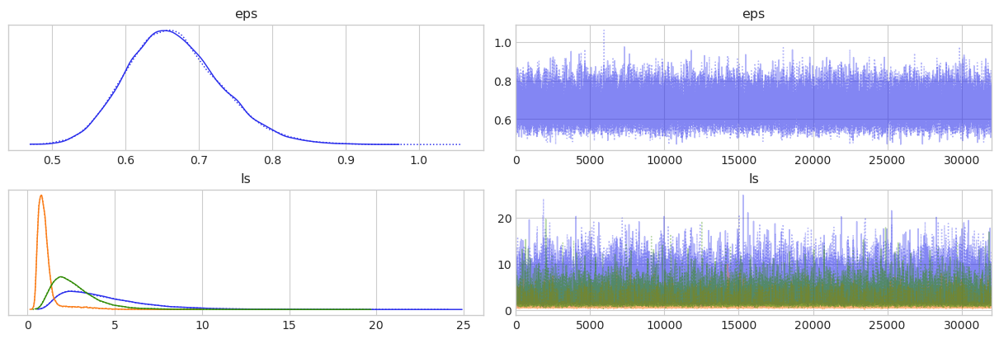

In [31]:
plot_trace(trace, ['eps', 'ls'])

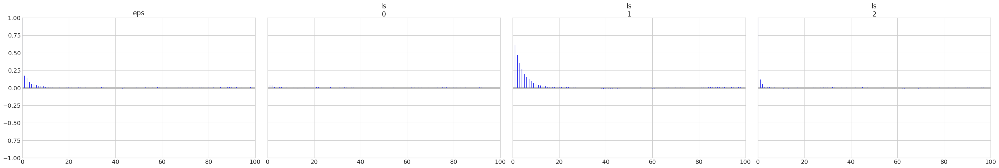

In [32]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [33]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

C:\Users\pasqu\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


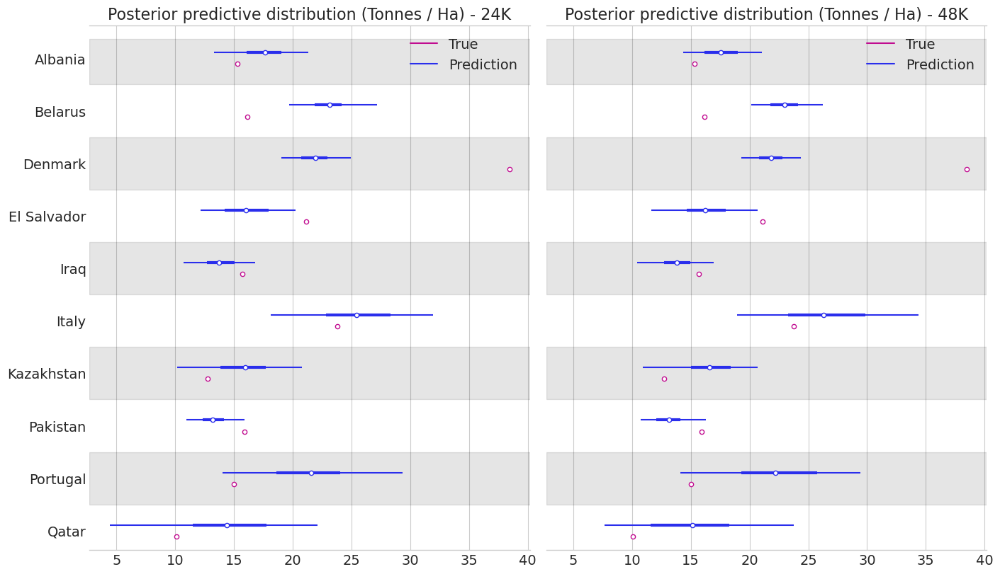

In [34]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['expquad2']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='Posterior predictive distribution (Tonnes / Ha) - 24K')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='Posterior predictive distribution (Tonnes / Ha) - 48K')
plt.show()

[]

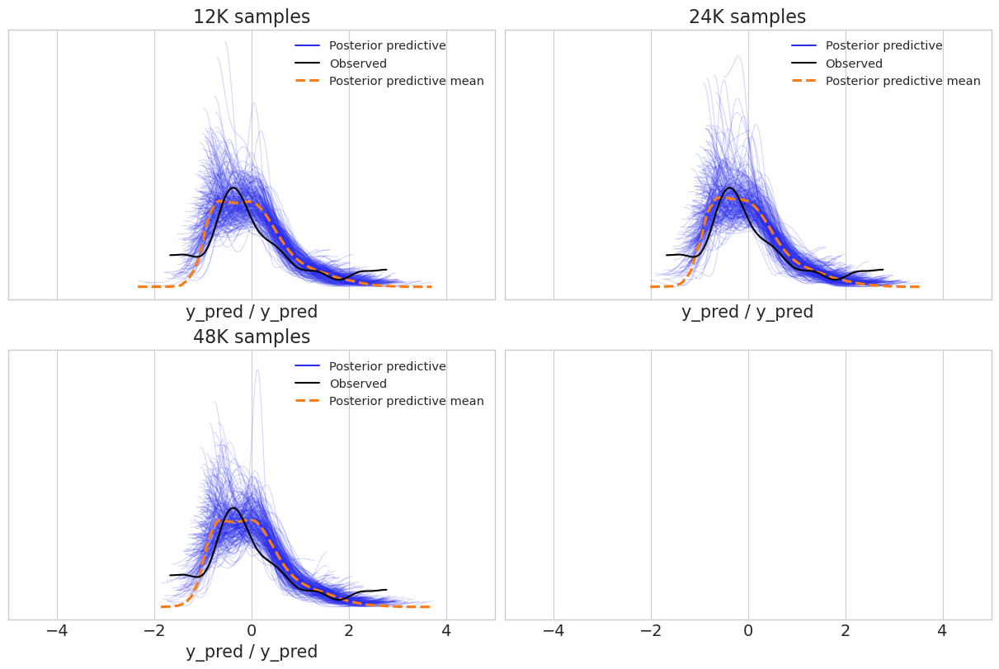

In [35]:
fig, ((ax1, ax2), (ax3, _)) = plt.subplots(ncols=2, nrows=2, figsize=(12, 8), sharex=True, sharey=True)
ax1.set_title('12K samples')
ax2.set_title('24K samples')
ax3.set_title('48K samples')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred': results['expquad1']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred': results['expquad2']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax2)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax3)
ax2.set_xlim((-5, 5))
plt.plot()

In [36]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data, show=False)
print("R2  12K: {} \t MAE 12K: {}".format(results['expquad1']['r2'], results['expquad1']['mae']))
print("R2  24K: {} \t MAE 24K: {}".format(results['expquad2']['r2'], results['expquad2']['mae']))
print("R2  48K: {} \t MAE 48K: {}".format(r2, mae))

R2  12K: 0.6345848849562421 	 MAE 12K: 47047.30554743862
R2  24K: 0.6339344819346913 	 MAE 24K: 47012.899766683666
R2  48K: 0.6255398272641381 	 MAE 48K: 47876.202319782475


In [37]:
results['expquad3'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

###  Thousand of samples

In [38]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.ExpQuad(n_features, ls) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

# Sample from posterior
with model:
    trace = pm.sample(
        draws=128_000, tune=64_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, ls]


Sampling 2 chains for 64_000 tune and 128_000 draw iterations (128_000 + 256_000 draws total) took 4958 seconds.


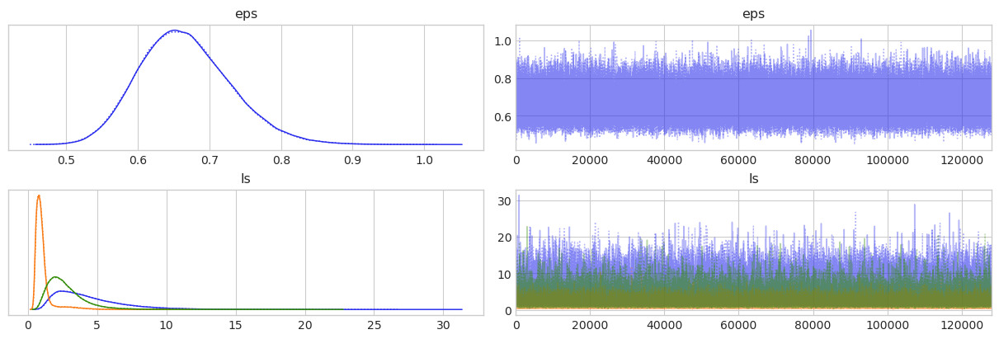

In [39]:
plot_trace(trace, ['eps', 'ls'])

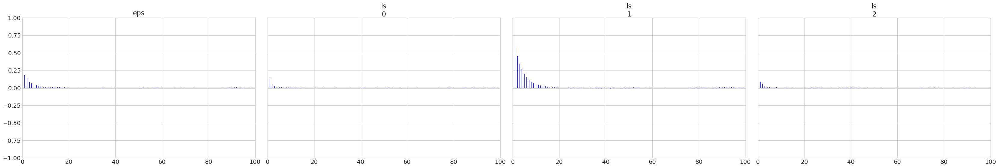

In [40]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [41]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

C:\Users\pasqu\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


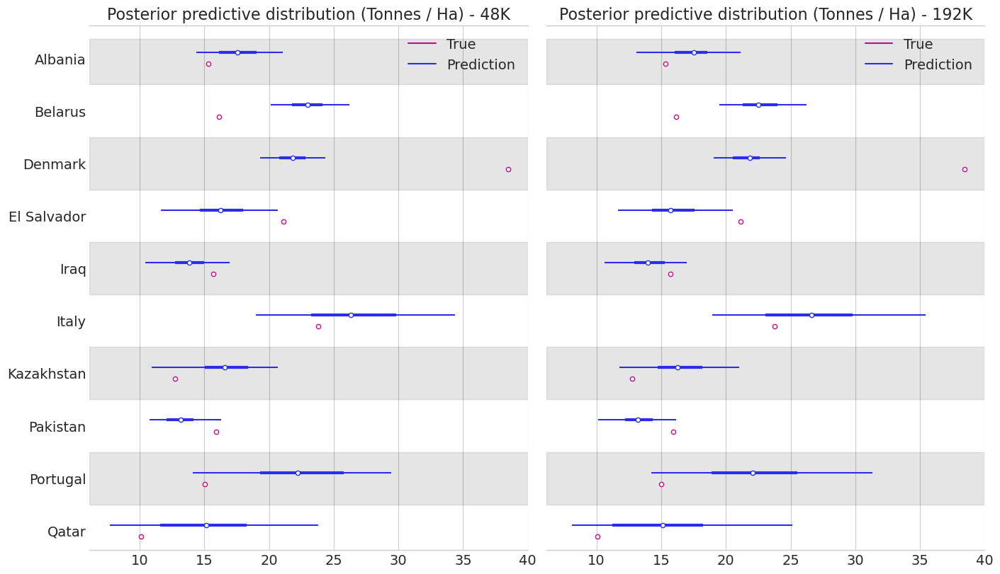

In [42]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['expquad3']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='Posterior predictive distribution (Tonnes / Ha) - 48K')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='Posterior predictive distribution (Tonnes / Ha) - 192K')
plt.show()

In [43]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data, show=False)
print("R2  12K : {} \t MAE 12K : {}".format(results['expquad1']['r2'], results['expquad1']['mae']))
print("R2  24K : {} \t MAE 24K : {}".format(results['expquad2']['r2'], results['expquad2']['mae']))
print("R2  48K : {} \t MAE 48K : {}".format(results['expquad3']['r2'], results['expquad3']['mae']))
print("R2  192K: {} \t MAE 192K: {}".format(r2, mae))

R2  12K : 0.6345848849562421 	 MAE 12K : 47047.30554743862
R2  24K : 0.6339344819346913 	 MAE 24K : 47012.899766683666
R2  48K : 0.6255398272641381 	 MAE 48K : 47876.202319782475
R2  192K: 0.6221763119744133 	 MAE 192K: 48005.98863540065


[]

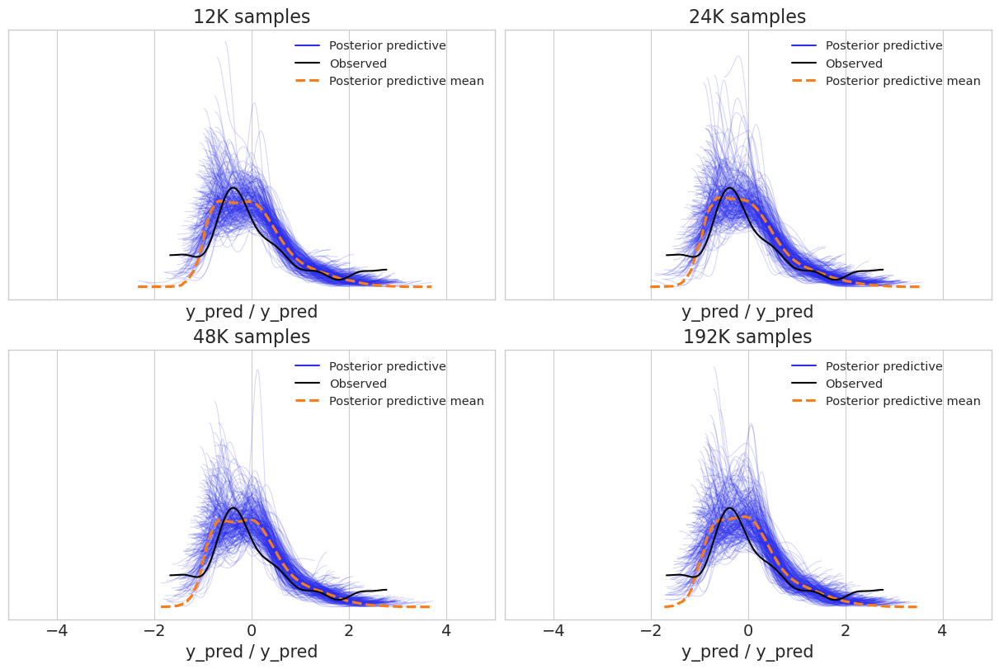

In [44]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(ncols=2, nrows=2, figsize=(12, 8), sharex=True, sharey=True)
ax1.set_title('12K samples')
ax2.set_title('24K samples')
ax3.set_title('48K samples')
ax4.set_title('192K samples')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred': results['expquad1']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred': results['expquad2']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax2)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred': results['expquad3']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax3)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax4)
ax2.set_xlim((-5, 5))
plt.plot()

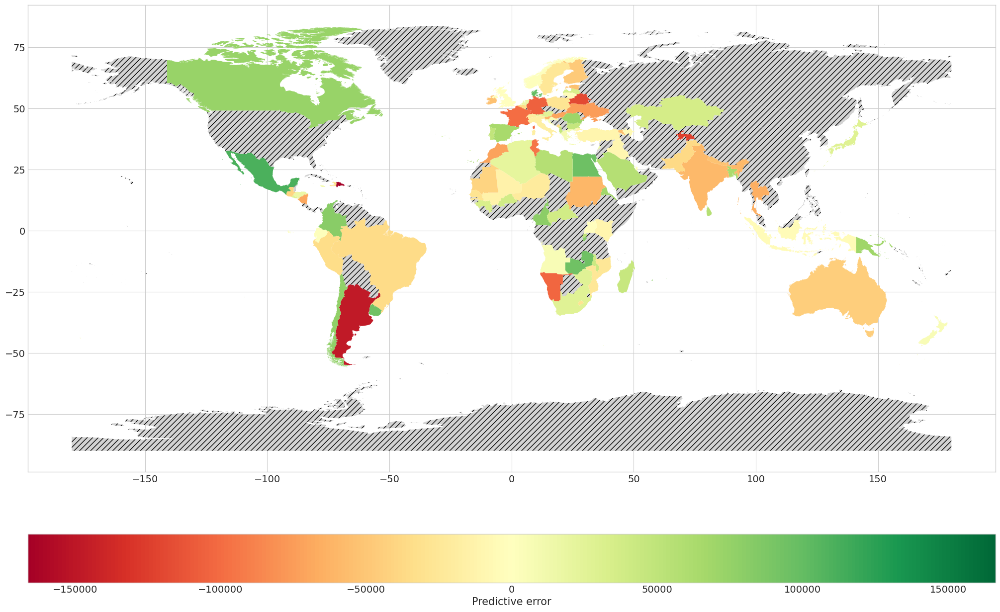

In [45]:
world_error_plot(world, pred_samples, y_mean, y_stddev, y_data)

In [46]:
results['expquad4'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

## Another model, with polynomial kernel, grade 2

The polynomial kernel is a generalization of the linear.
It corresponds to a polynomial model just as the linear kernel corresponds to a linear one.
$$
k(x, x') = \big[(x - c)(x' - c) + \mathcal{offset}\big]^d
$$

In [50]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    offset = pm.Normal('offset', 0, 0.5)
    c = pm.Normal('c', 0, 0.5, shape=n_features)
    grade = 2
    # Instantiate the covariance function
    cov = pm.gp.cov.Polynomial(n_features, c=c, d=grade, offset=offset) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [51]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16000, tune=8000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True, target_accept=0.95
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, c, offset]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 1508 seconds.
There were 1233 divergences after tuning. Increase `target_accept` or reparameterize.
There were 3505 divergences after tuning. Increase `target_accept` or reparameterize.
The number of effective samples is smaller than 25% for some parameters.


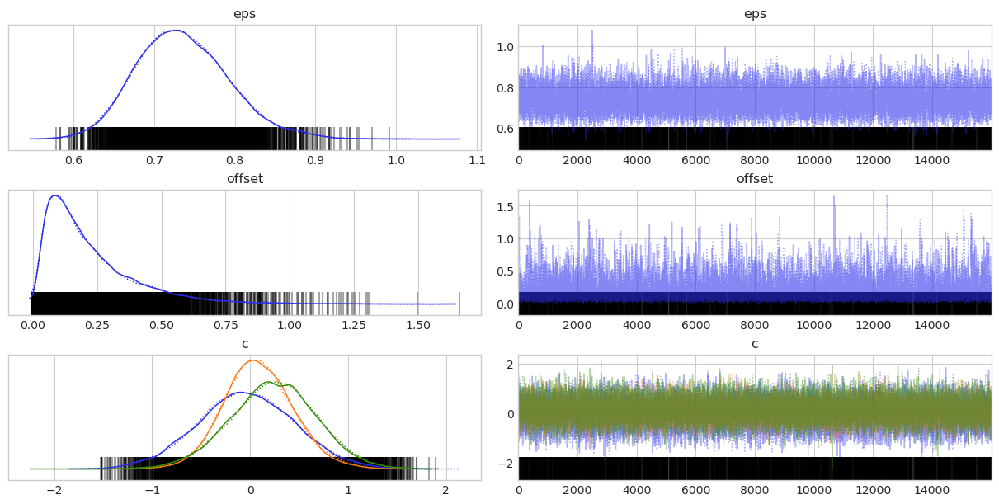

In [52]:
plot_trace(trace, ['eps', 'offset', 'c'])

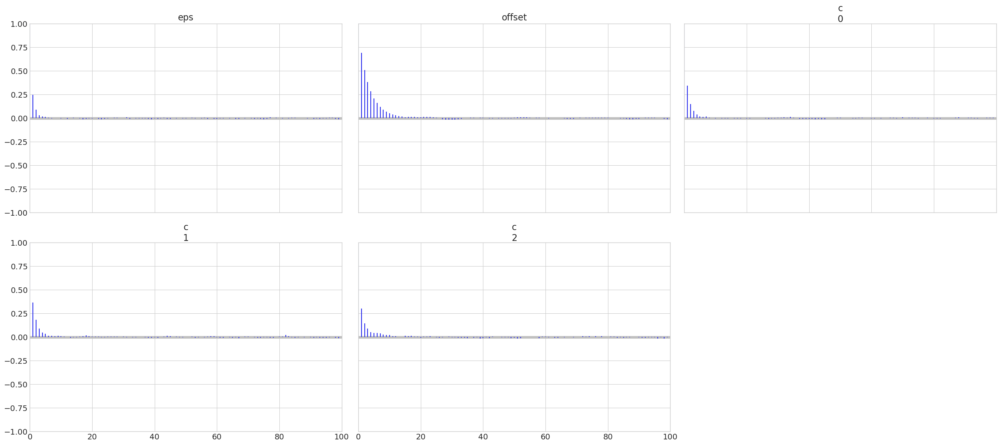

In [53]:
az.plot_autocorr(trace, var_names=['eps', 'offset', 'c'], combined=True)
plt.show()

C:\Users\pasqu\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


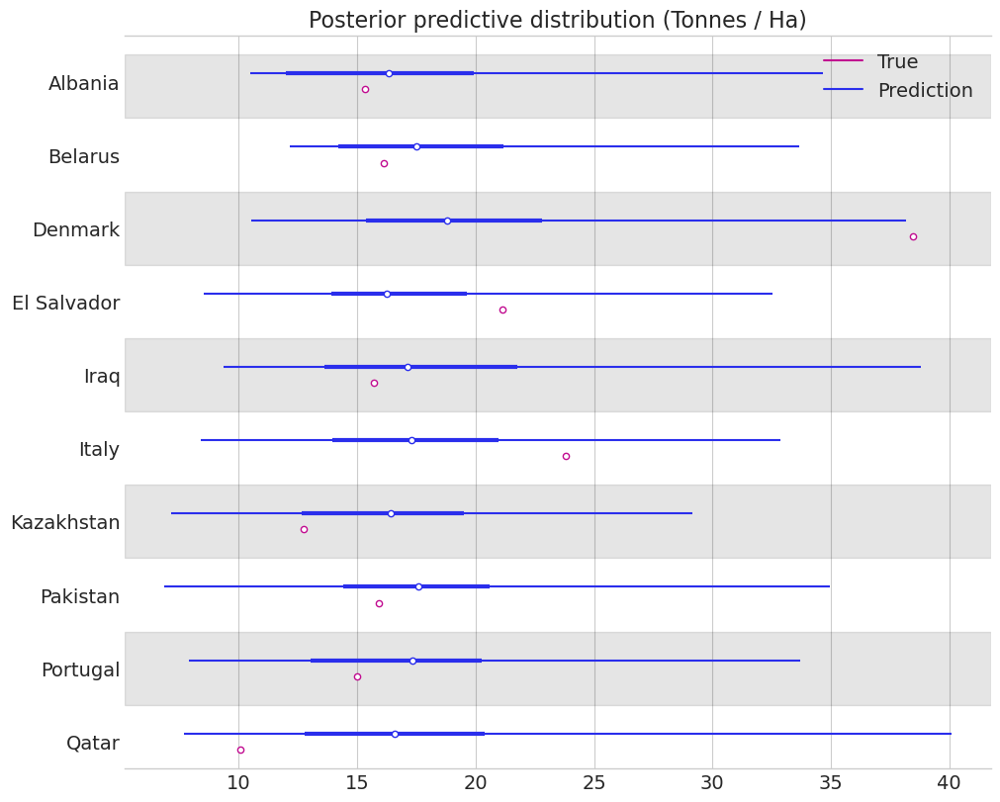

In [54]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')
plot_test(pred_samples[test_indices].T, y_mean, y_stddev,
          y_test_data, countries[test_indices])

Not able to sample from conditional as the matrix is not positive definite

In [55]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data)

R2 : 0.5302236501369928
MAE: 52104.05685093036


In [56]:
results['poly'] = {
    'trace': trace,
    'pred_samples': None,
    'mae': None,
    'r2': None,
}

### Grade 3

In [57]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    offset = pm.Normal('offset', 0, 8)
    c = pm.Normal('c', 0, 8, shape=n_features)
    grade = 3
    # Instantiate the covariance function
    cov = pm.gp.cov.Polynomial(n_features, c=c, d=grade, offset=offset) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    
# Sample from posterior
with model:
    trace = pm.sample(
        draws=8000, tune=4000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True, target_accept=0.95
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, c, offset]


Sampling 2 chains for 4_000 tune and 8_000 draw iterations (8_000 + 16_000 draws total) took 1106 seconds.
There were 3112 divergences after tuning. Increase `target_accept` or reparameterize.
There were 7004 divergences after tuning. Increase `target_accept` or reparameterize.
The number of effective samples is smaller than 10% for some parameters.


In [58]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    offset = pm.Normal('offset', 0, 8)
    c = pm.Normal('c', 0, 8, shape=n_features)
    mu = 3
    grade = pm.Poisson("grade", mu)
    # Instantiate the covariance function
    cov = pm.gp.cov.Polynomial(n_features, c=c, d=grade, offset=offset) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    
# Sample from posterior
with model:
    trace = pm.sample(
        draws=8000, tune=4000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Sequential sampling (2 chains in 1 job)
CompoundStep
>NUTS: [eps, c, offset]
>Metropolis: [grade]


Sampling 2 chains for 4_000 tune and 8_000 draw iterations (8_000 + 16_000 draws total) took 477 seconds.
C:\Users\pasqu\.conda\envs\pymc_env\lib\site-packages\arviz\stats\diagnostics.py:586: RuntimeWarning: invalid value encountered in double_scalars
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
There were 3725 divergences after tuning. Increase `target_accept` or reparameterize.
There were 7786 divergences after tuning. Increase `target_accept` or reparameterize.
The number of effective samples is smaller than 25% for some parameters.


### A simple function

In [92]:
fun = lambda x: x**3 - 7*x**2 - 2*x + 10
fun = np.vectorize(fun)

In [93]:
x_fun = np.linspace(-10, 10, 100)

In [94]:
y_fun = fun(x_fun)

In [95]:
x_std_fun, x_mean_fun, x_stddev_fun = standardize_data(x_fun)
y_std_fun, y_mean_fun, y_stddev_fun = standardize_data(y_fun)

In [148]:
y_std_noise = y_std_fun + np.random.normal(0,0.1,100)

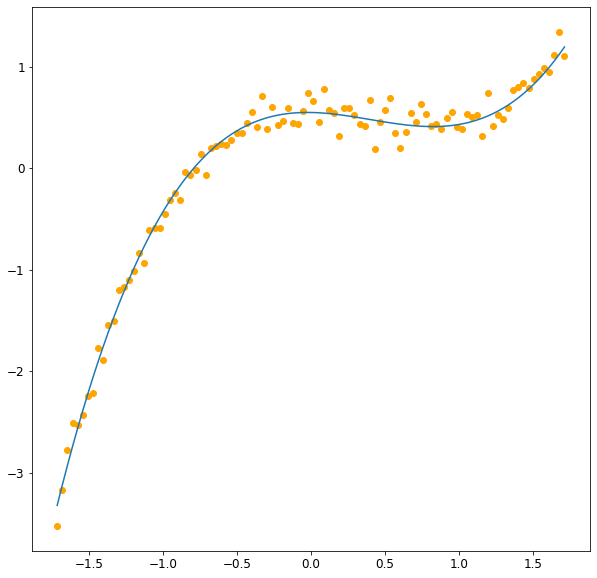

In [153]:
plt.figure(figsize=(10, 10))
plt.plot(x_std_fun, y_std_fun)
plt.scatter(x_std_fun, y_std_noise, c='orange')
plt.show()

In [152]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    offset = pm.Normal('offset', 0, 0.5)
    c = pm.Normal('c', 0, 0.5)
    grade = 3
    # Instantiate the covariance function
    cov = pm.gp.cov.Polynomial(1, c=c, d=grade, offset=offset) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=np.expand_dims(x_std_fun, axis=1), y=y_std_noise, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

    
# Sample from posterior
with model:
    trace = pm.sample(
        draws=8000, tune=4000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True,
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, c, offset]


Sampling 2 chains for 4_000 tune and 8_000 draw iterations (8_000 + 16_000 draws total) took 155 seconds.
There were 83 divergences after tuning. Increase `target_accept` or reparameterize.
There were 311 divergences after tuning. Increase `target_accept` or reparameterize.


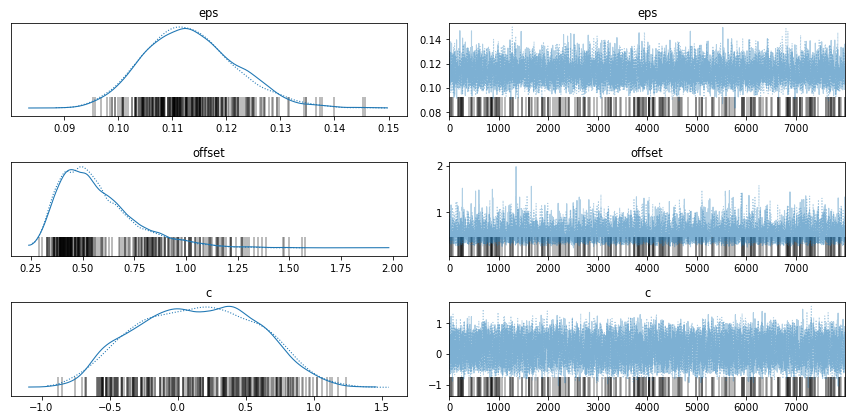

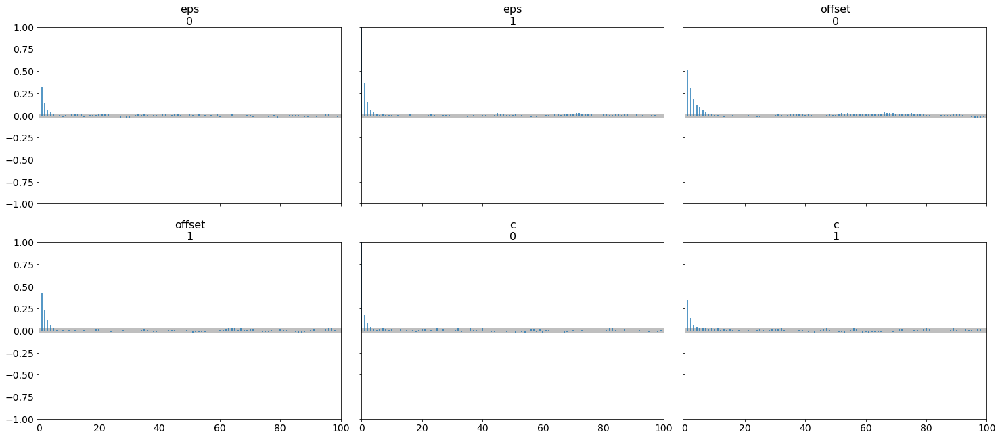

In [154]:
plot_trace(trace, ['eps', 'offset', 'c'])

In [155]:
x_new = (np.random.rand(100) * 3) - 1.5
print(np.expand_dims(x_new, axis=1).shape)
y_new = gp_model.sample_conditional(trace, np.expand_dims(x_new, axis=1), 'f_pred')

(100, 1)


C:\Users\PasqualeDeMarinis\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


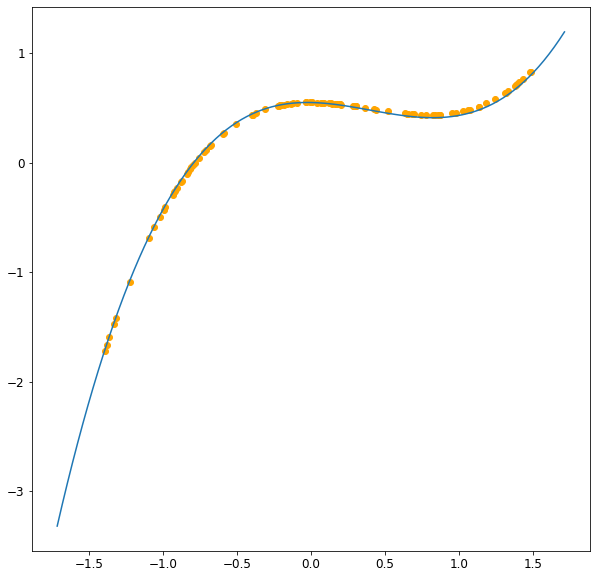

In [156]:
plt.figure(figsize=(10, 10))
plt.plot(x_std_fun, y_std_fun)
plt.scatter(x_new, np.median(y_new, axis=0), c='orange')
plt.show()

## Exponential Kernel

Similar to Exponential Quadratic, but with absolute value instead of the square
$$
\phi(x,x') = \exp \left( -\frac{||x-x'||}{2\ell^2} \right)
$$

In [71]:
def covariance_matrix(x, kf, **kwargs):
    x1 = np.expand_dims(x, axis=0)
    x2 = np.expand_dims(x, axis=1)
    return kf(x1, x2, **kwargs)

def gp_sample(kf, xmin=-4.0, xmax=4.0, n_samples=150, return_cov=False, **kwargs):
    x = np.linspace(xmin, xmax, n_samples)
    m = np.zeros(n_samples)
    if not return_cov:
        k = covariance_matrix(x, kf, **kwargs)
    else:
        x1 = np.expand_dims(x, axis=1)
        k = kf(x1, x1, **kwargs)
    y = np.random.multivariate_normal(mean=m, cov=k)
    return x, y, k

def plot_gp_sample(name, kf, kwargs_ls, n_functions=3, return_cov=False, multicol=1, col=0, subplots=None):
    np.random.seed(42)
    ls_kwargs = [dict(zip(kwargs_ls, v)) for v in zip(*kwargs_ls.values())]
    plt.rcParams['axes.grid'] = False
    ncols = 2 * multicol
    if col == 0:
        fig, axs = plt.subplots(nrows=len(ls_kwargs), ncols=ncols, figsize=(15, 3.5 * len(ls_kwargs)))
    else:
        fig, axs = subplots
    if len(ls_kwargs) == 1:
        kwargs = ls_kwargs[0]
        axs[col * 2].set_title('{} {}'.format(name, kwargs))
        for k in range(n_functions):
            x, y, k = gp_sample(kf, return_cov=return_cov, **kwargs)
            axs[col * 2].plot(x, y)
        axs[2 * col + 1].xaxis.tick_top()
        axs[2 * col + 1].set_xticks([0, len(k) - 1], labels=[0, '{}'.format(len(k))])
        axs[2 * col + 1].set_yticks([0, len(k) - 1], labels=[0, '{}'.format(len(k))])
        axs[2 * col + 1].invert_yaxis()
        im = axs[2 * col + 1].imshow(k, interpolation='antialiased')
        plt.colorbar(im, ax=axs[2 * col + 1]) 
    else:
        for i, kwargs in enumerate(ls_kwargs):
            axs[i, col * 2].set_title('{} {}'.format(name, kwargs))
            for k in range(n_functions):
                x, y, k = gp_sample(kf, return_cov=return_cov, **kwargs)
                axs[i, col * 2].plot(x, y)
            axs[i, 2 * col + 1].xaxis.tick_top()
            axs[i, 2 * col + 1].set_xticks([0, len(k) - 1], labels=[0, '{}'.format(len(k))])
            axs[i, 2 * col + 1].set_yticks([0, len(k) - 1], labels=[0, '{}'.format(len(k))])
            axs[i, 2 * col + 1].invert_yaxis()
            im = axs[i, 2 * col + 1].imshow(k, interpolation='antialiased')
            plt.colorbar(im, ax=axs[i, 2 * col + 1])
    fig.tight_layout()
    return fig, axs
    
def kernel_expquad(x1, x2, l): return np.exp(-((x1 - x2) ** 2.0) / (2 * l ** 2.0))
def kernel_exp(x1, x2, l): return np.exp(-np.abs(x1 - x2) / (2 * l ** 2.0))

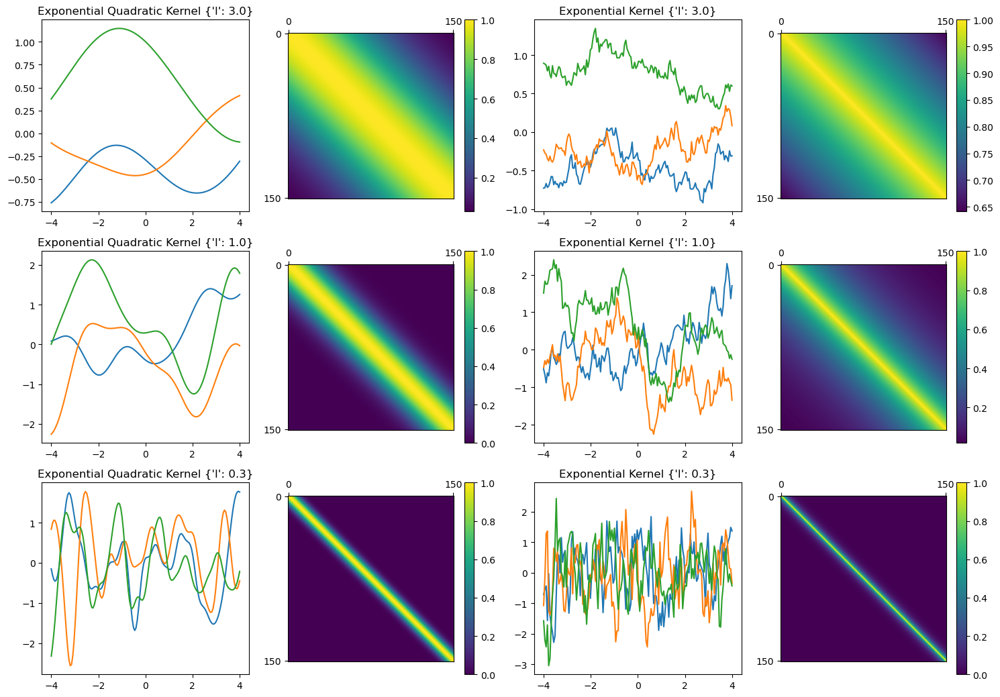

In [89]:
with plt.style.context('default'):
    subplots = plot_gp_sample("Exponential Quadratic Kernel", kernel_expquad, kwargs_ls={'l': [3.0, 1.0, 0.3]}, multicol=2, col=0)
    plot_gp_sample("Exponential Kernel", kernel_exp, kwargs_ls={'l': [3.0, 1.0, 0.3]}, multicol=2, col=1, subplots=subplots)
    plt.show()

In [59]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.Exponential(n_features, ls) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [60]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, ls]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 596 seconds.


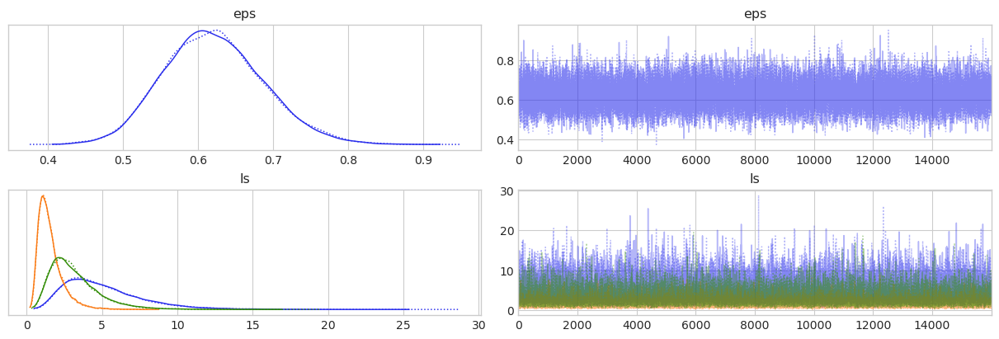

In [61]:
plot_trace(trace, ['eps', 'ls'])

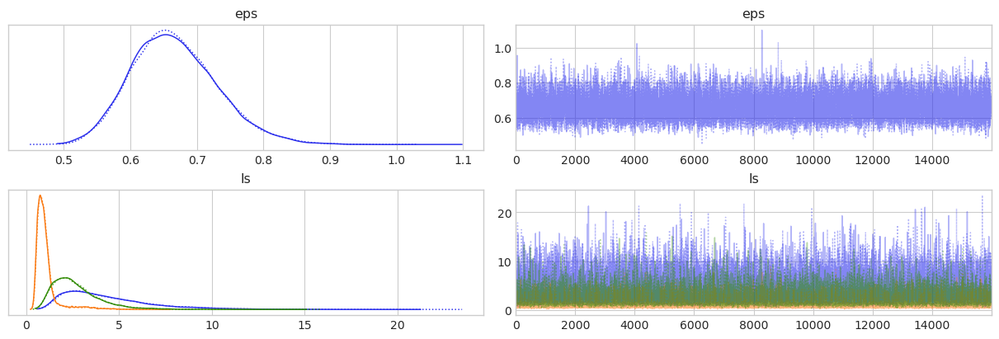

In [62]:
plot_trace(results['expquad2']['trace'], ['eps', 'ls'])

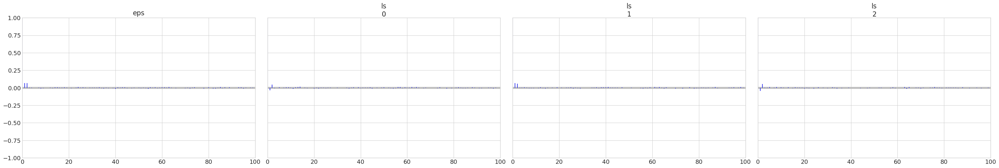

In [63]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [64]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

C:\Users\pasqu\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


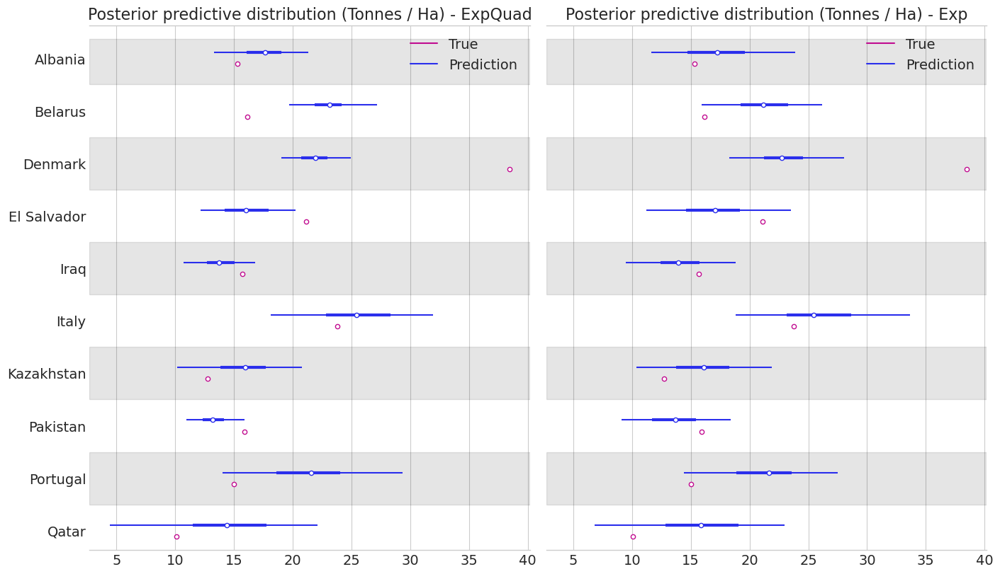

In [65]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['expquad2']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='Posterior predictive distribution (Tonnes / Ha) - ExpQuad')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='Posterior predictive distribution (Tonnes / Ha) - Exp')
plt.show()

[]

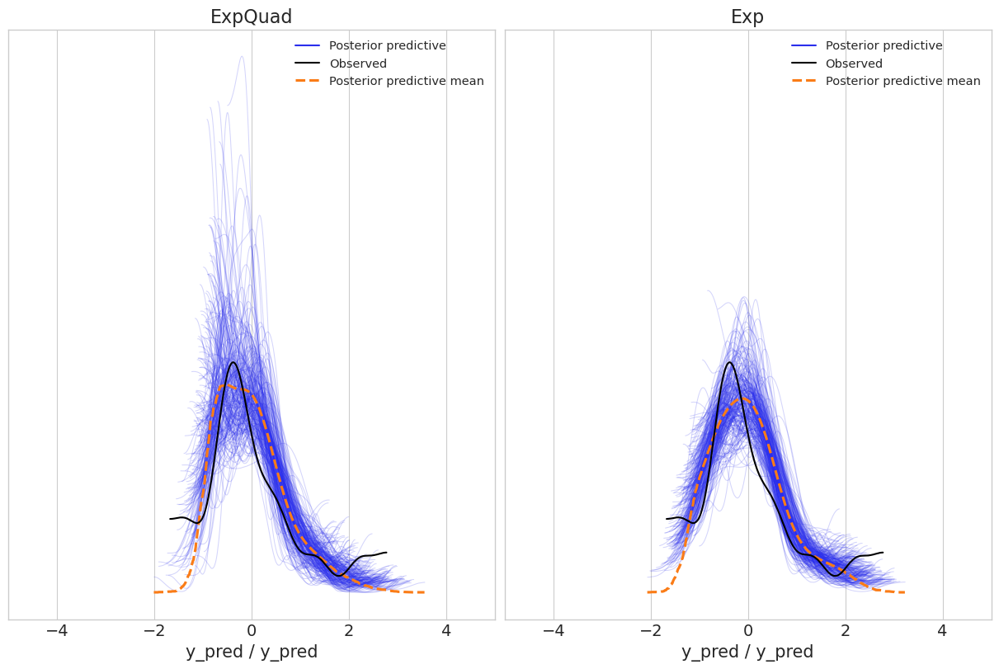

In [66]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 8), sharex=True, sharey=True)
ax1.set_title('ExpQuad')
ax2.set_title('Exp')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred': results['expquad2']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax2)
ax2.set_xlim((-5, 5))
plt.plot()

In [67]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data, show=False)
print("R2  ExpQuad: {} \t MAE ExpQuad: {}".format(results['expquad2']['r2'], results['expquad2']['mae']))
print("R2  Exp    : {} \t MAE Exp    : {}".format(r2, mae))

R2  ExpQuad: 0.6339344819346913 	 MAE ExpQuad: 47012.899766683666
R2  Exp    : 0.728958391821784 	 MAE Exp    : 40547.29322439355


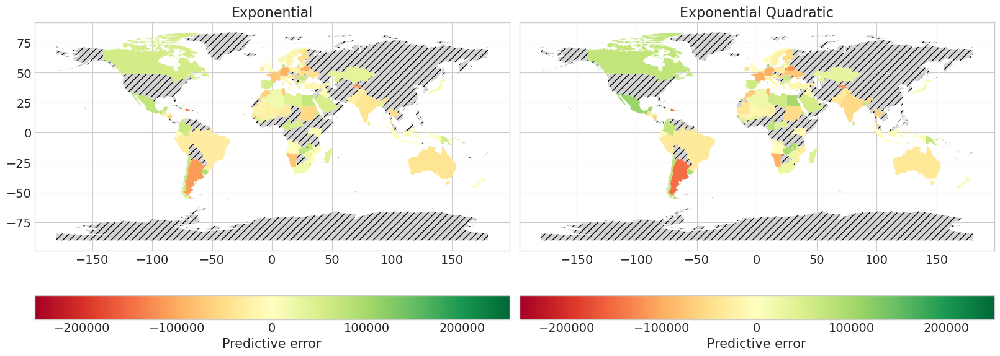

In [68]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 10), sharex=True, sharey=True)
ax1.set_title('Exponential')
ax2.set_title('Exponential Quadratic')
world_error_plot(world, results['expquad2']['pred_samples'], y_mean, y_stddev, y_data, axes=ax2, max_error=250_000)
world_error_plot(world, pred_samples, y_mean, y_stddev, y_data, axes=ax1, max_error=250_000)

In [69]:
results['exp'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

## Rational Exponential Kernel

$$
\phi(x,x') = \exp \left(1 + \frac{||x-x'||**2}{2\ell^2} \right)^-\alpha
$$

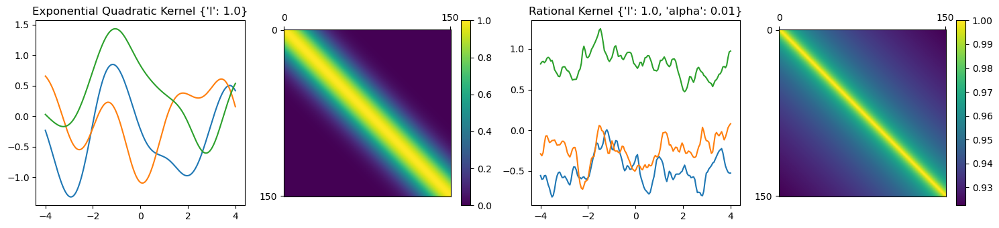

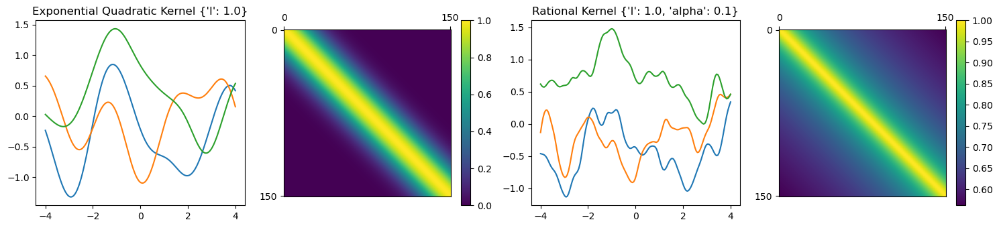

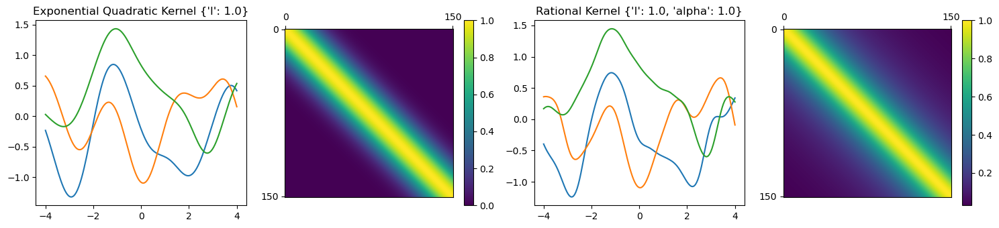

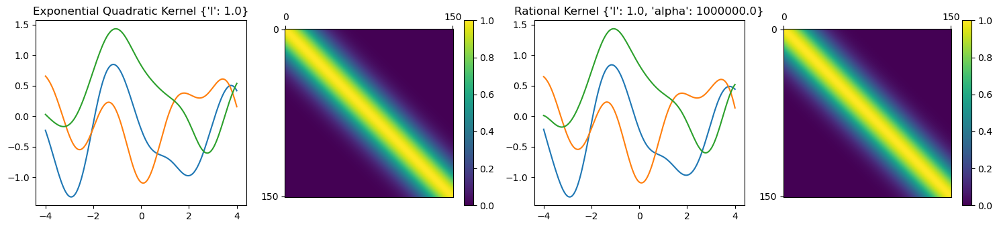

In [72]:
def kernel_ratquad(x, y, l, alpha): return (1 + ((x - y)**2)/(2*alpha*l**2))**-alpha
args = [
    ({'l': [1.0]}, {'alpha': [0.01]}),
    ({'l': [1.0]}, {'alpha': [0.1]}),
    ({'l': [1.0]}, {'alpha': [1.0]}),
    ({'l': [1.0]}, {'alpha': [1000000.0]}),
]
with plt.style.context('default'):
    for arg in args:
        subplots = plot_gp_sample("Exponential Quadratic Kernel", kernel_expquad, kwargs_ls=arg[0], multicol=2, col=0)
        plot_gp_sample("Rational Kernel", kernel_ratquad, kwargs_ls={**arg[0], **arg[1]}, multicol=2, col=1, subplots=subplots)
        plt.show()

In [77]:
#### Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.HalfNormal('ls', 0.5)
    alpha = pm.Gamma('alpha', 2.0, 0.5)
    # Instantiate the covariance function
    cov = pm.gp.cov.RatQuad(n_features, ls=ls, alpha=alpha) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True, target_accept=0.95
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, alpha, ls]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 1332 seconds.
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.
There were 2 divergences after tuning. Increase `target_accept` or reparameterize.


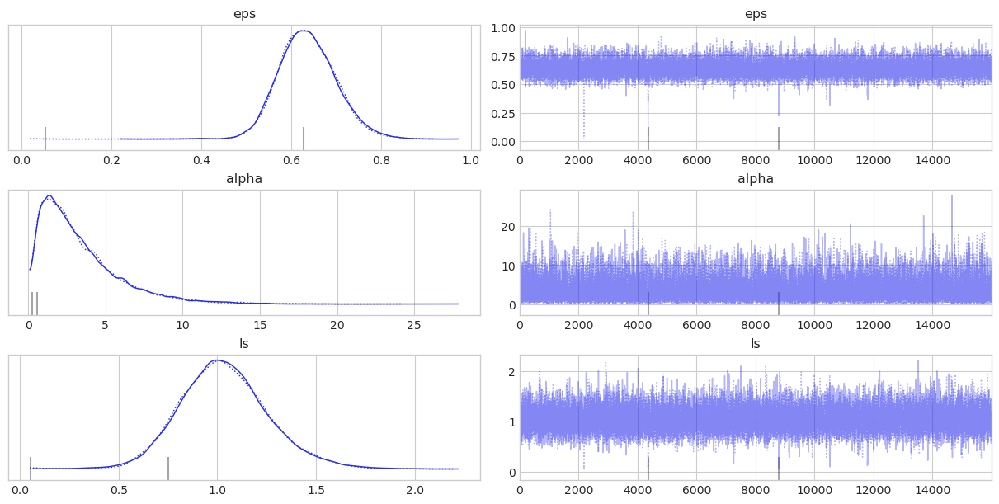

In [78]:
plot_trace(trace, ['eps', 'alpha', 'ls'])

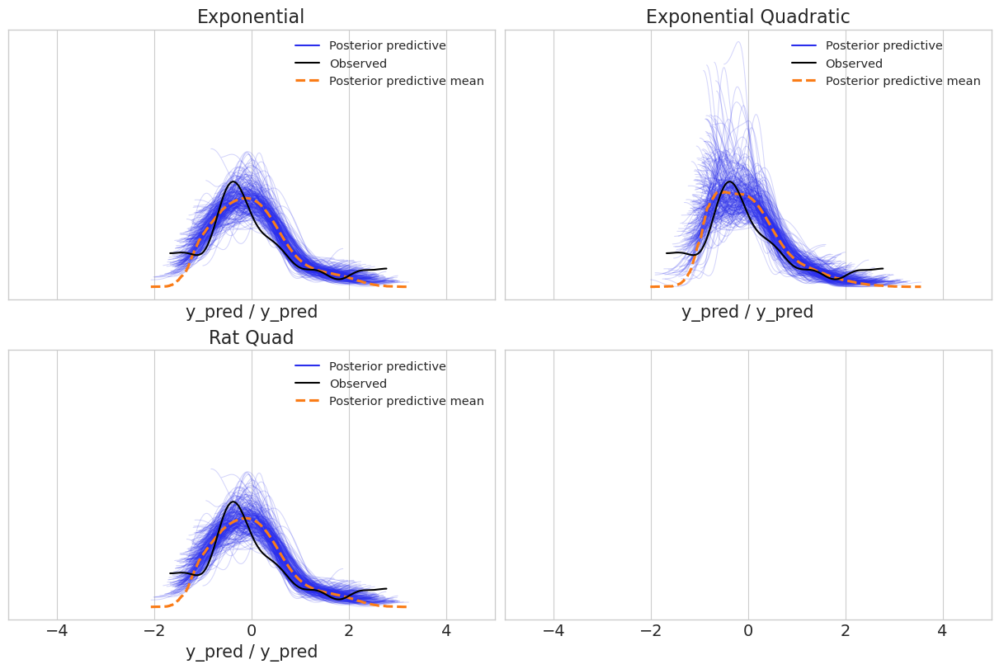

In [79]:
fig, ((ax1, ax2), (ax3, _)) = plt.subplots(ncols=2, nrows=2, figsize=(12, 8), sharex=True, sharey=True)
ax1.set_title('Exponential')
ax2.set_title('Exponential Quadratic')
ax3.set_title('Rat Quad')
ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['expquad2']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax2)
ax2.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['exp']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax3)
ax1.set_xlim((-5, 5))
plt.plot()
plt.show()

In [80]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

C:\Users\pasqu\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


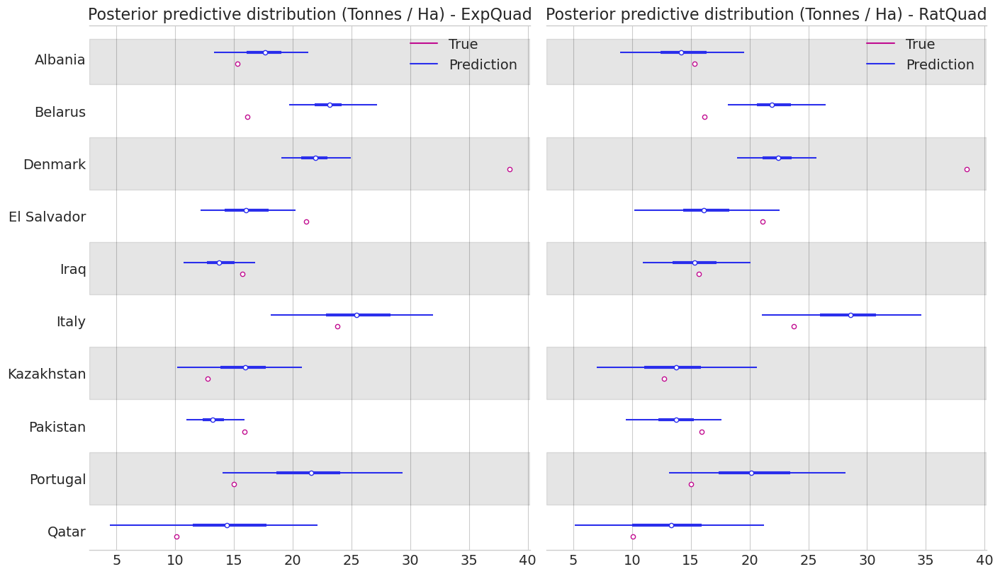

In [81]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['expquad2']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='Posterior predictive distribution (Tonnes / Ha) - ExpQuad')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='Posterior predictive distribution (Tonnes / Ha) - RatQuad')
plt.show()

Major flexibility has allowed us to reach better results and catch more uncertainty

In [82]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data, show=False)
print("ExpQuad: R2: {} \t MAE: {}".format(results['expquad2']['r2'], results['expquad2']['mae']))
print("Exp    : R2: {} \t MAE: {}".format(results['exp']['r2'], results['exp']['mae']))
print("RatQuad: R2: {} \t MAE: {}".format(r2, mae))

ExpQuad: R2: 0.6339344819346913 	 MAE: 47012.899766683666
Exp    : R2: 0.728958391821784 	 MAE: 40547.29322439355
RatQuad: R2: 0.700176579783148 	 MAE: 41472.47112695806


In [ ]:
results['rat'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

## Matern32 Kernel

The Matern kernel with $\nu$ = 3/2
$$
k(x, x') = \Bigg( 1 + \frac{\sqrt{3(x - x')^2}}{\mathit{l}} \Bigg) exp \Bigg[ - \frac{\sqrt{3(x - x')^2}}{\mathit{l}} \Bigg]
$$

Kernel used in applications of multivariate statistical analysis on metric spaces.
It is a generalization of the **RBF** kernel, generalized by the parameter $\nu$

In [ ]:
def matern32(x, y, l): return np.array(pm.gp.cov.Matern32(1, ls=l)(x, y).eval())
def matern52(x, y, l): return np.array(pm.gp.cov.Matern52(1, ls=l)(x, y).eval())
subplots = plot_gp_sample("Matern32", matern32, return_cov=True, kwargs_ls={'l': [3.0, 1.0, 0.3]}, multicol=2, col=0)
plot_gp_sample("Matern52", matern52, return_cov=True, kwargs_ls={'l': [3.0, 1.0, 0.3]}, multicol=2, col=1, subplots=subplots)
plt.show()
#plot_gp_sample("Exponential Kernel", kernel_exp, kwargs_ls={'l': [3.0, 1.0, 0.3]})

In [4]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.Matern32(n_features, ls=ls) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [5]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, ls]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 499 seconds.


Recall Exp results

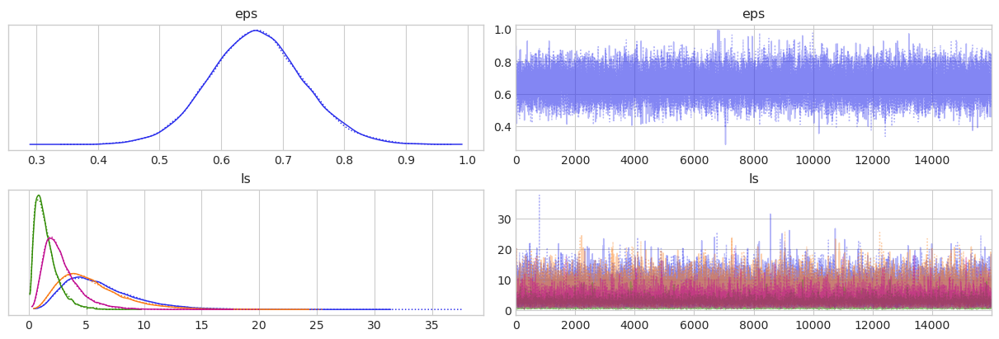

In [77]:
plot_trace(results['exp']['trace'], ['eps', 'ls'])

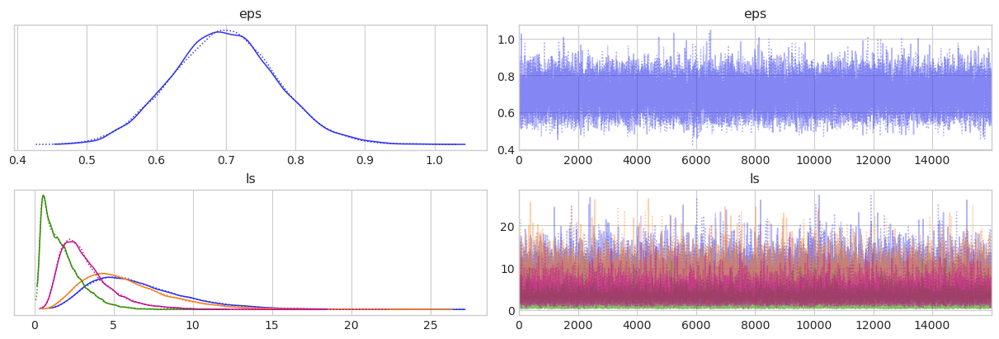

In [228]:
plot_trace(trace, ['eps', 'ls'])

Recall ExpQuad results

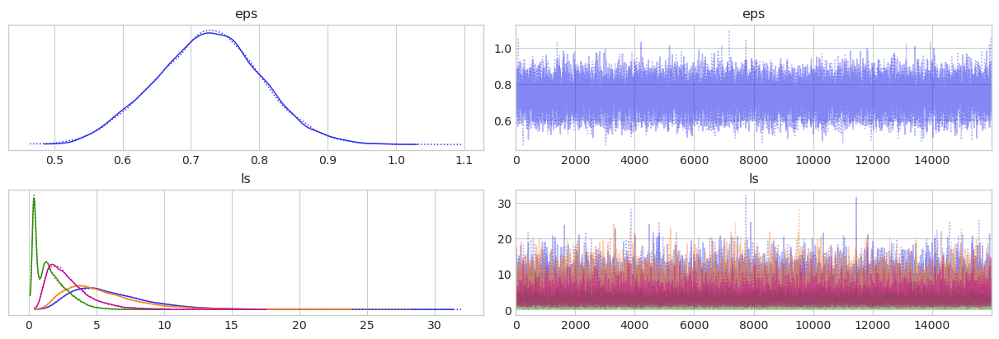

In [76]:
plot_trace(results['expquad2']['trace'], ['eps', 'ls'])

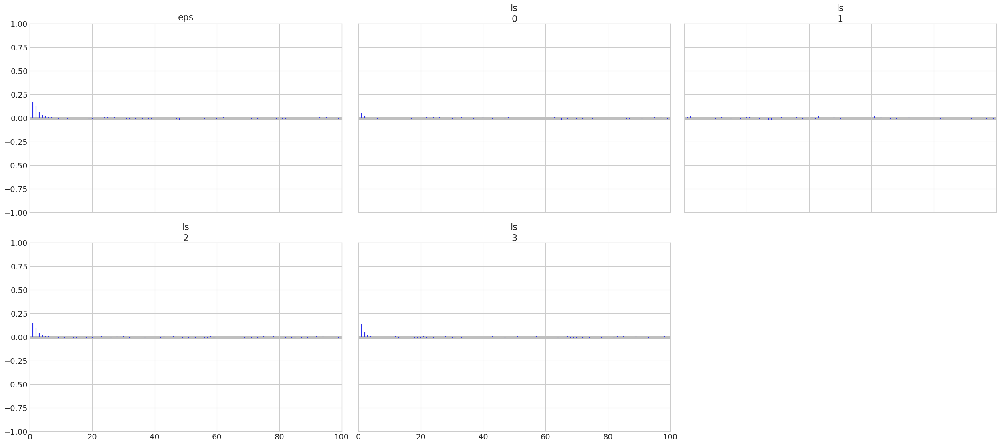

In [229]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [7]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

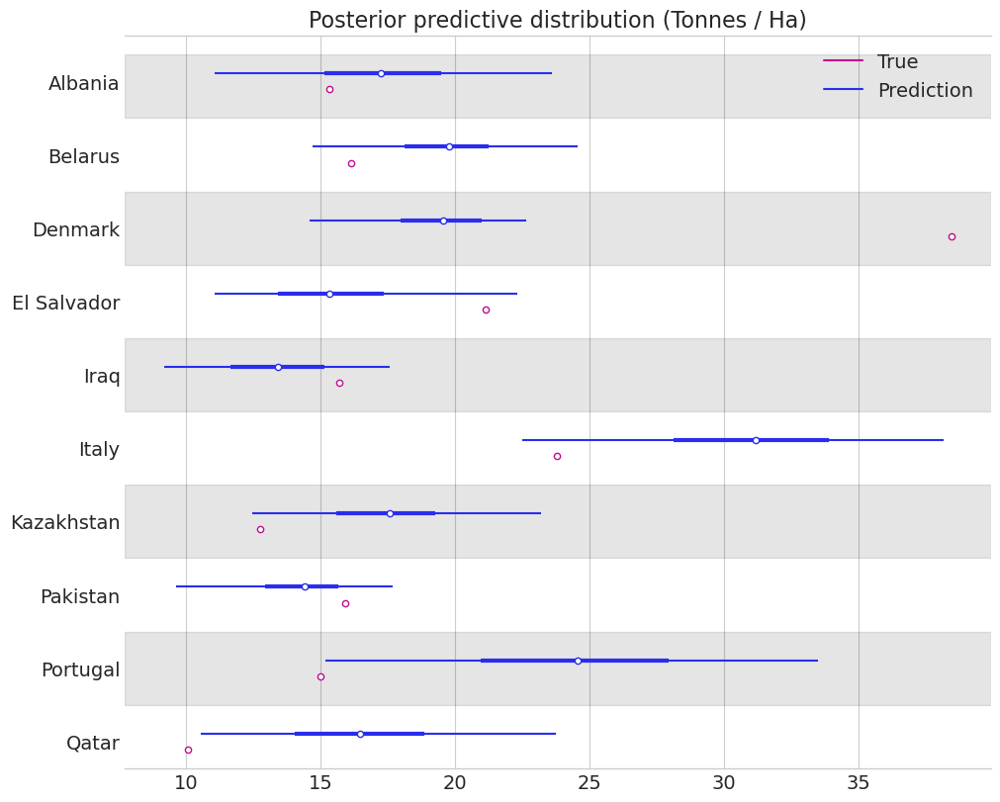

In [124]:
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices])

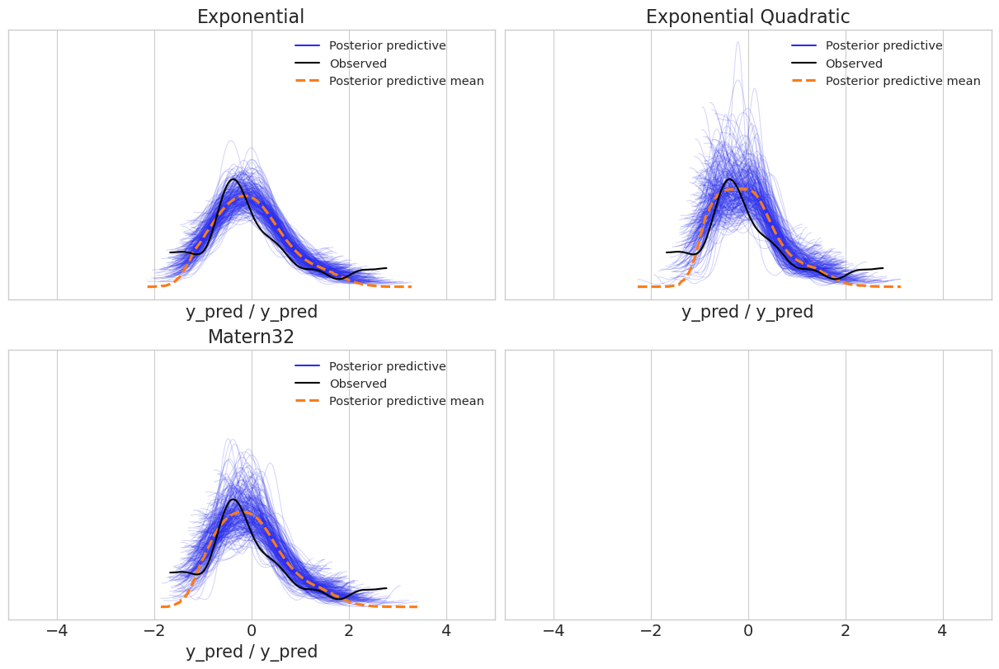

In [81]:
fig, ((ax1, ax2), (ax3, _)) = plt.subplots(ncols=2, nrows=2, figsize=(12, 8), sharex=True, sharey=True)
ax1.set_title('Exponential')
ax2.set_title('Exponential Quadratic')
ax3.set_title('Matern32')
ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['expquad2']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax2)
ax2.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['exp']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax3)
ax1.set_xlim((-5, 5))
plt.plot()
plt.show()

In [8]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data)

R2 : 0.611737109609299
MAE: 48324.3842487406


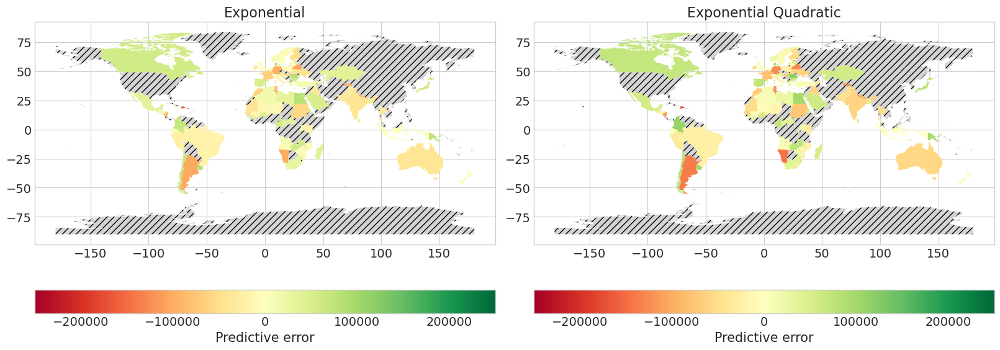

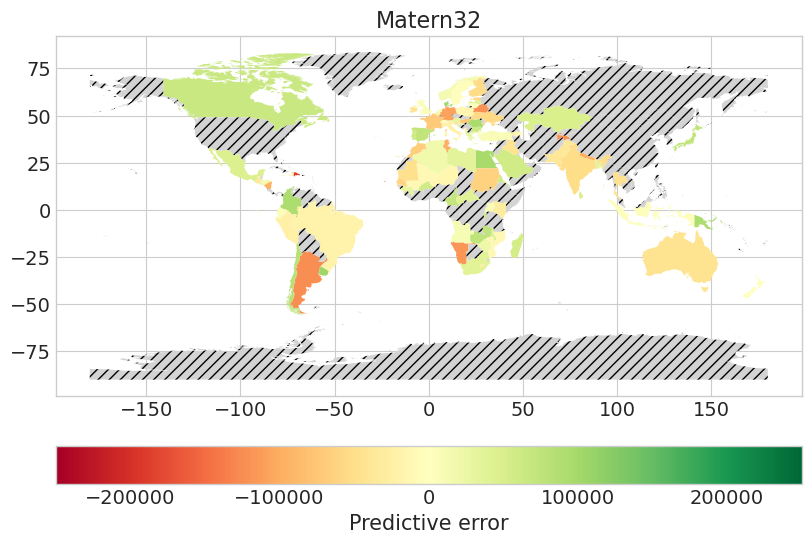

In [83]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 10))
fig, ax3 = plt.subplots(figsize=(8, 6))
ax1.set_title('Exponential')
ax2.set_title('Exponential Quadratic')
ax3.set_title('Matern32')
world_error_plot(world, results['exp']['pred_samples'], y_mean, y_stddev, y_data, axes=ax1, max_error=250000)
world_error_plot(world, results['expquad2']['pred_samples'], y_mean, y_stddev, y_data, axes=ax2, max_error=250000)
world_error_plot(world, pred_samples, y_mean, y_stddev, y_data, axes=ax3, max_error=250000)
plt.show()

In [11]:
results['matern32'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

## Combyning kernels

### Summing
Summing kernels can be interpreted as a logical OR, value is high when at least one is high

In [83]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    c = pm.Normal('c', 0, 8, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.Exponential(n_features, ls=ls) + \
        pm.gp.cov.Linear(n_features, c=c) + \
        pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [84]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, c, ls]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 1072 seconds.


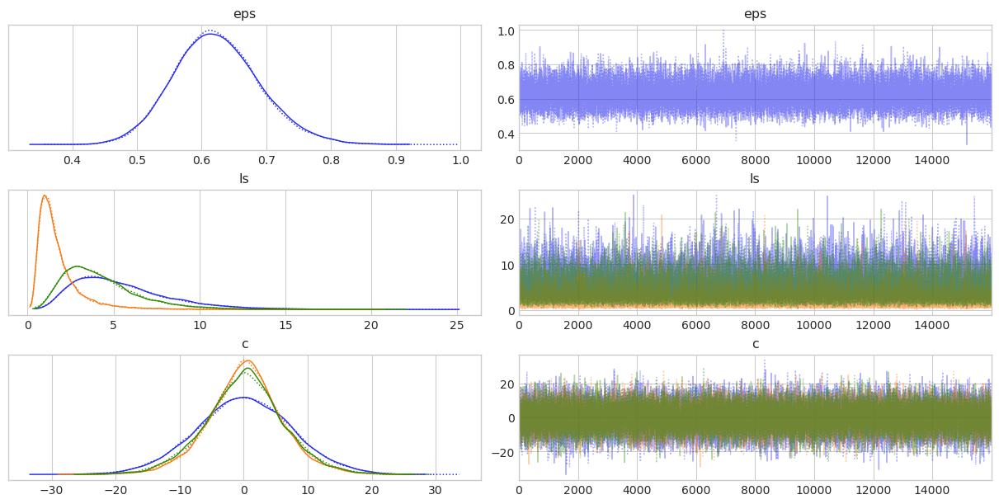

In [85]:
plot_trace(trace, ['eps', 'ls', 'c'])

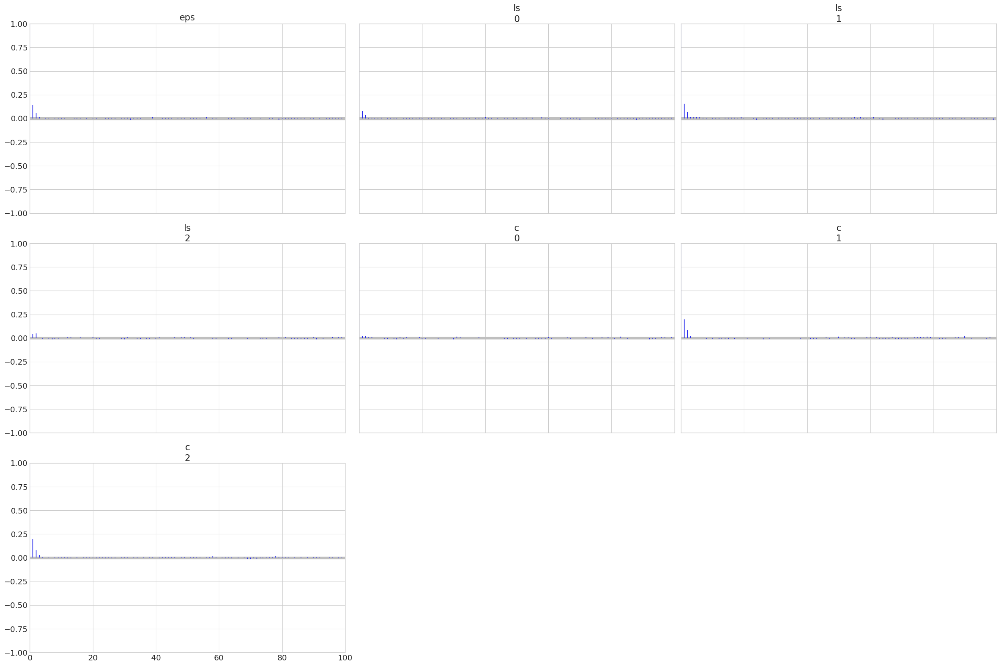

In [86]:
az.plot_autocorr(trace, var_names=['eps', 'ls', 'c'], combined=True)
plt.show()

In [87]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

C:\Users\pasqu\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


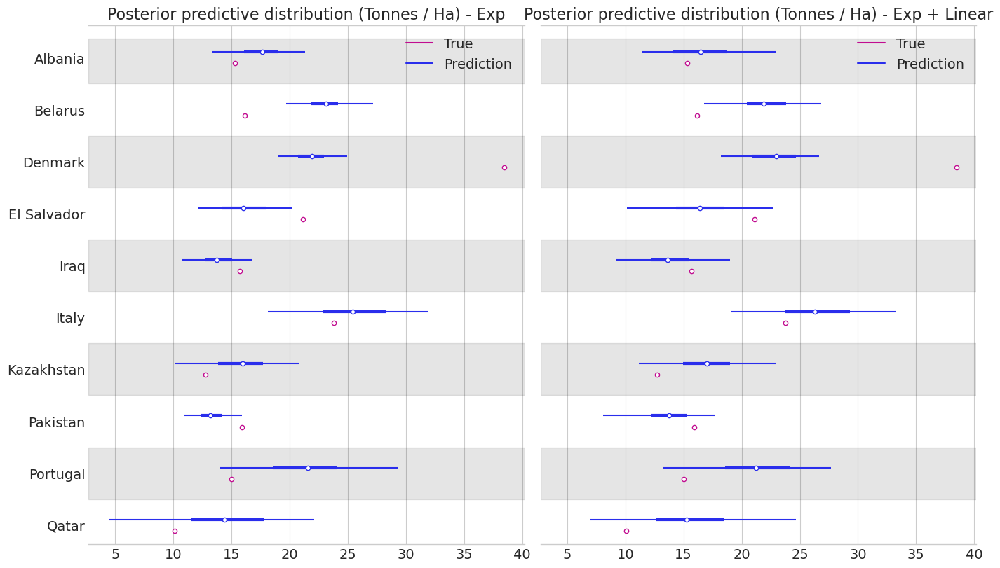

In [88]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['expquad2']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='Posterior predictive distribution (Tonnes / Ha) - Exp')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='Posterior predictive distribution (Tonnes / Ha) - Exp + Linear')
plt.show()

In [89]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data, show=False)
print("Exp: R2: {} \t MAE: {}".format(results['exp']['r2'], results['exp']['mae']))
print("Sum: R2: {} \t MAE: {}".format(r2, mae))

Exp: R2: 0.728958391821784 	 MAE: 40547.29322439355
Sum: R2: 0.7254434258764769 	 MAE: 41082.804777482444


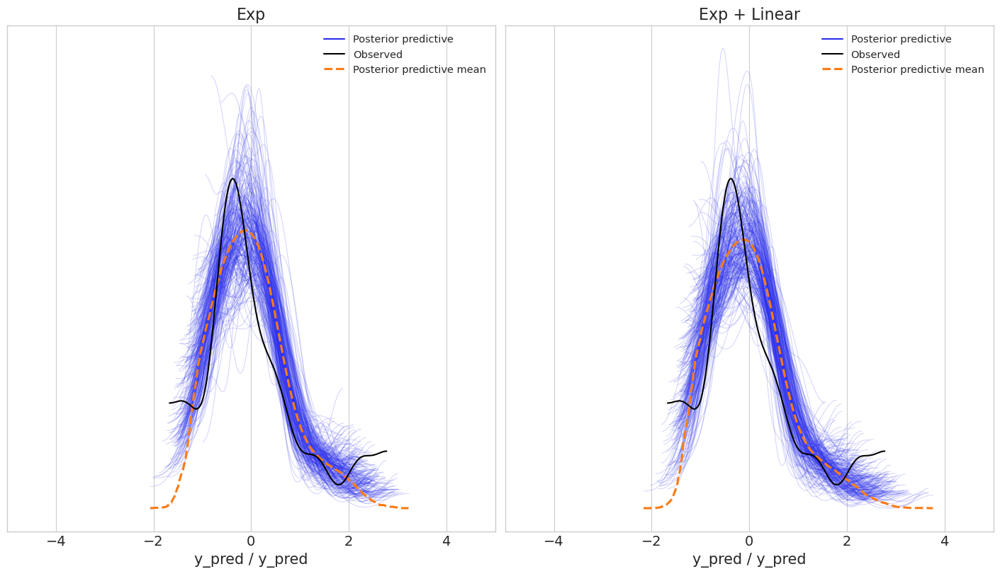

In [90]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
ax1.set_title('Exp')
ax2.set_title('Exp + Linear')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['exp']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax2)
ax1.set_xlim((-5, 5))
plt.plot()
plt.show()

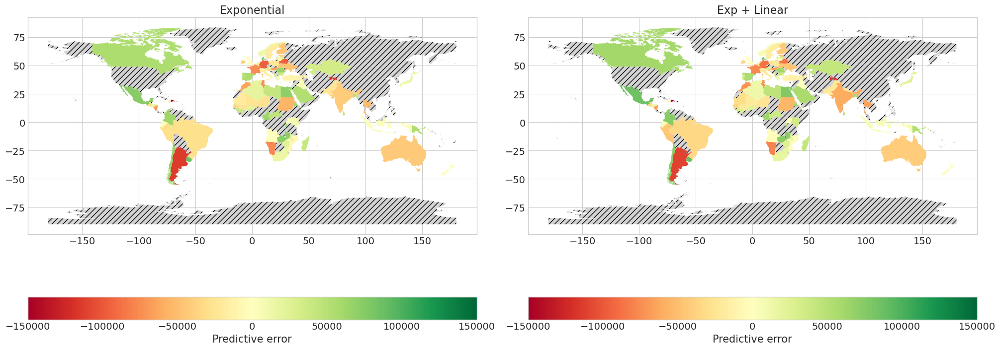

In [91]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 20))
ax1.set_title('Exponential')
ax2.set_title('Exp + Linear')
world_error_plot(world, results['exp']['pred_samples'], y_mean, y_stddev, y_data, axes=ax1, max_error=150_000)
world_error_plot(world, pred_samples, y_mean, y_stddev, y_data, axes=ax2, max_error=150_000)
plt.show()

In [92]:
results['exp_linear_sum'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

### Weighted sum
We can put weights on the kernels to see the importances

In [93]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    c = pm.Normal('c', 0, 8, shape=n_features)
    # Instantiate the covariance function
    w0 = pm.HalfNormal('w0', 5)
    w1 = pm.HalfNormal('w1', 5)
    cov = pm.gp.cov.Exponential(n_features, ls=ls) * w0 + \
        pm.gp.cov.Linear(n_features, c=c) * w1 + \
        pm.gp.cov.WhiteNoise(1e-5) 
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [94]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True, target_accept=0.9
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, w1, w0, c, ls]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 1540 seconds.
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.


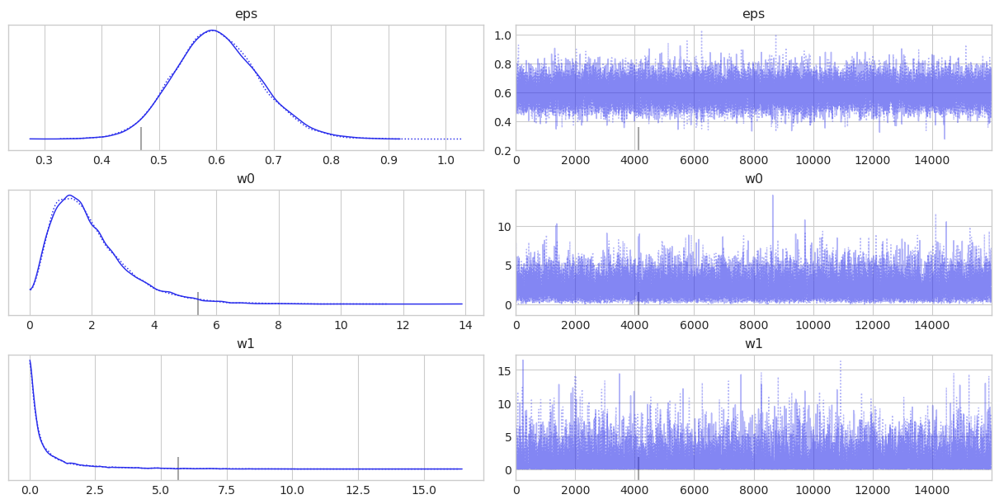

In [95]:
plot_trace(trace, ['eps', 'w0', 'w1'])

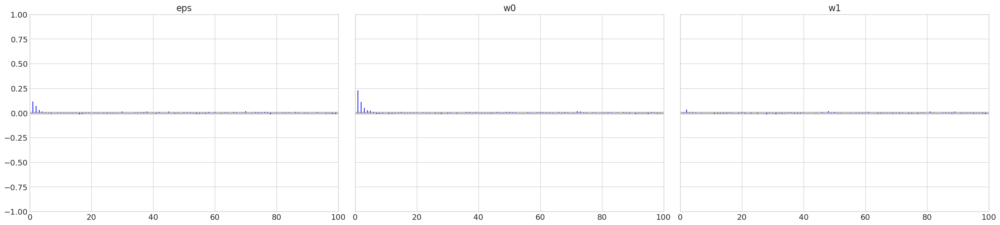

In [96]:
az.plot_autocorr(trace, var_names=['eps', 'w0', 'w1'], combined=True)
plt.show()

In [97]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

C:\Users\pasqu\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


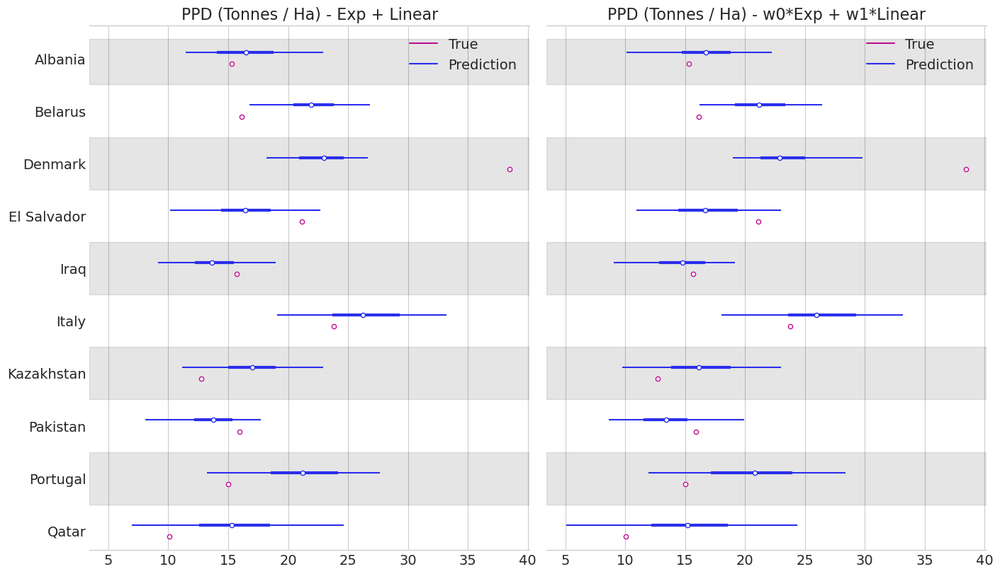

In [98]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['exp_linear_sum']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='PPD (Tonnes / Ha) - Exp + Linear')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='PPD (Tonnes / Ha) - w0*Exp + w1*Linear')
plt.show()

In [99]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data, show=False)
print("Exp + Linear      : R2: {} \t MAE: {}".format(results['exp_linear_sum']['r2'], results['exp_linear_sum']['mae']))
print("w0*Exp + w1*Linear: R2: {} \t MAE: {}".format(r2, mae))

Exp + Linear      : R2: 0.7254434258764769 	 MAE: 41082.804777482444
w0*Exp + w1*Linear: R2: 0.7587010777880591 	 MAE: 38223.50164513773


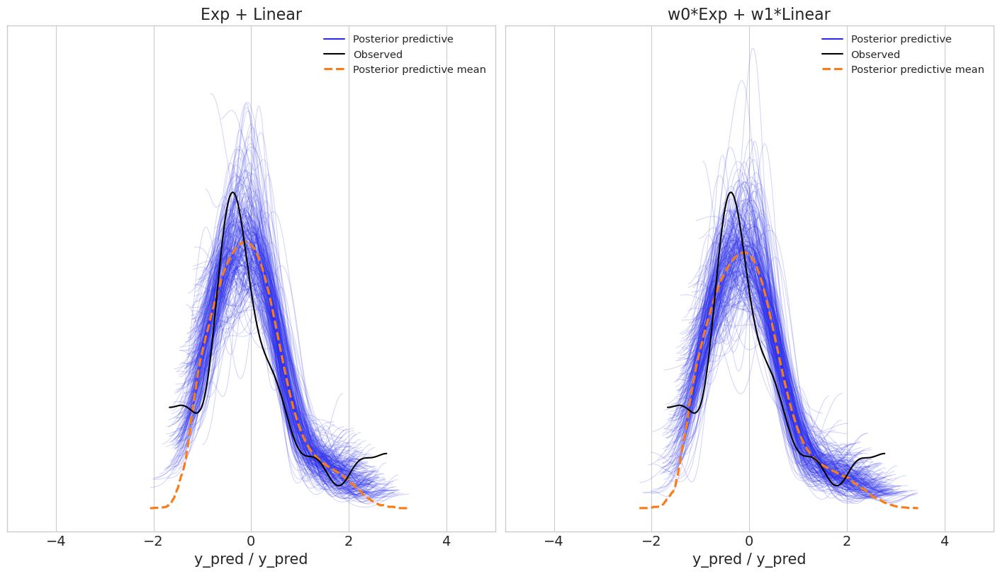

In [100]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
ax1.set_title('Exp + Linear')
ax2.set_title('w0*Exp + w1*Linear')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['exp']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax2)
ax1.set_xlim((-5, 5))
plt.plot()
plt.show()

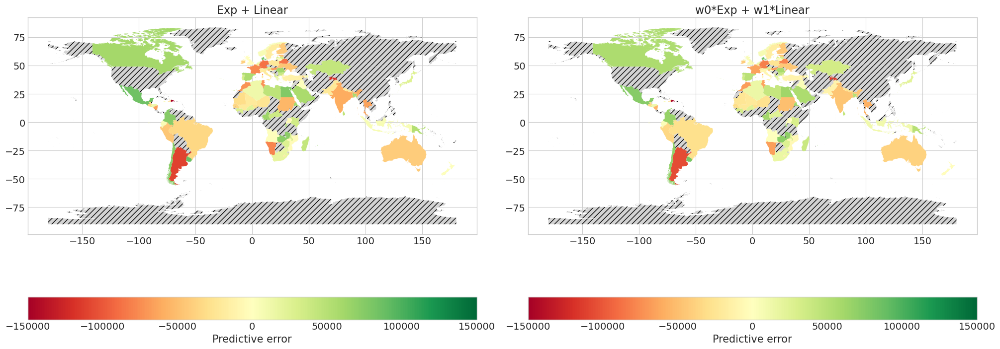

In [101]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 20))
ax1.set_title('Exp + Linear')
ax2.set_title('w0*Exp + w1*Linear')
world_error_plot(world, results['exp_linear_sum']['pred_samples'], y_mean, y_stddev, y_data, axes=ax1, max_error=150_000)
world_error_plot(world, pred_samples, y_mean, y_stddev, y_data, axes=ax2, max_error=150_000)
plt.show()

In [102]:
results['exp_linear_weighted'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

### Multiplying
Multiplying kernels can be interpreted as a logical AND, value is high when both are high 

In [103]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    c = pm.Normal('c', 0, 8, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.Exponential(n_features, ls=ls) * \
        pm.gp.cov.Linear(n_features, c=c) + \
        pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [104]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, c, ls]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 1059 seconds.
There were 8 divergences after tuning. Increase `target_accept` or reparameterize.


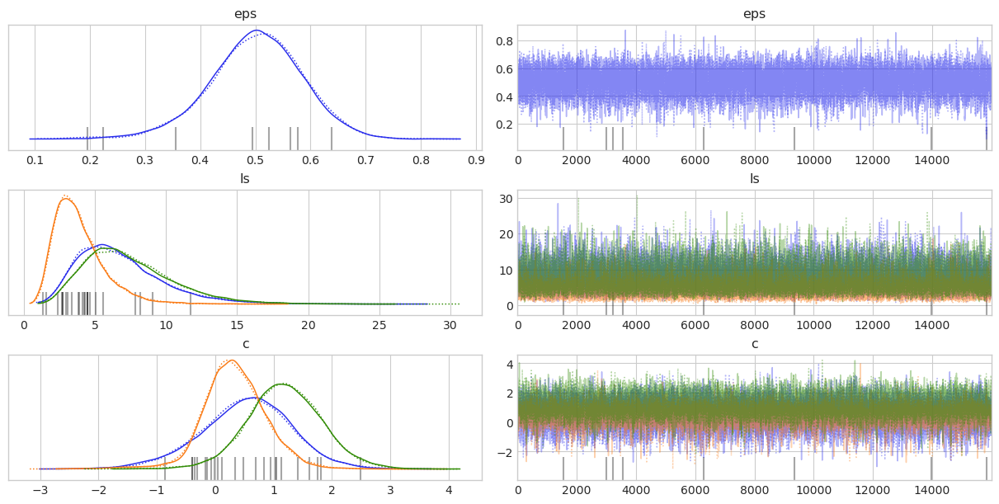

In [105]:
plot_trace(trace, ['eps', 'ls', 'c'])

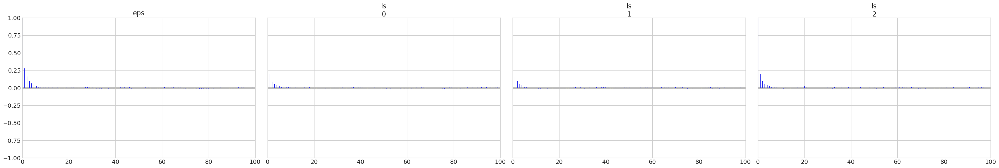

In [106]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [107]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

C:\Users\pasqu\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


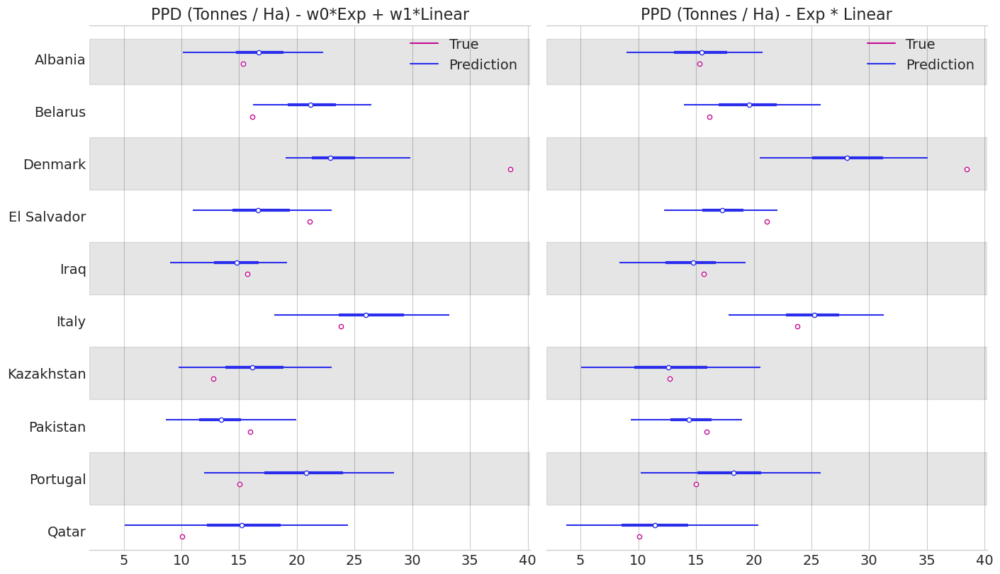

In [108]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['exp_linear_weighted']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='PPD (Tonnes / Ha) - w0*Exp + w1*Linear')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='PPD (Tonnes / Ha) - Exp * Linear')
plt.show()

In [109]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data, show=False)
print("Exp + Linear      : R2: {} \t MAE: {}".format(results['exp_linear_sum']['r2'], results['exp_linear_sum']['mae']))
print("w0*Exp + w1*Linear: R2: {} \t MAE: {}".format(results['exp_linear_weighted']['r2'], results['exp_linear_weighted']['mae']))
print("Exp * Linear      : R2: {} \t MAE: {}".format(r2, mae))

Exp + Linear      : R2: 0.7254434258764769 	 MAE: 41082.804777482444
w0*Exp + w1*Linear: R2: 0.7587010777880591 	 MAE: 38223.50164513773
Exp * Linear      : R2: 0.8700044424323334 	 MAE: 27725.795550085248


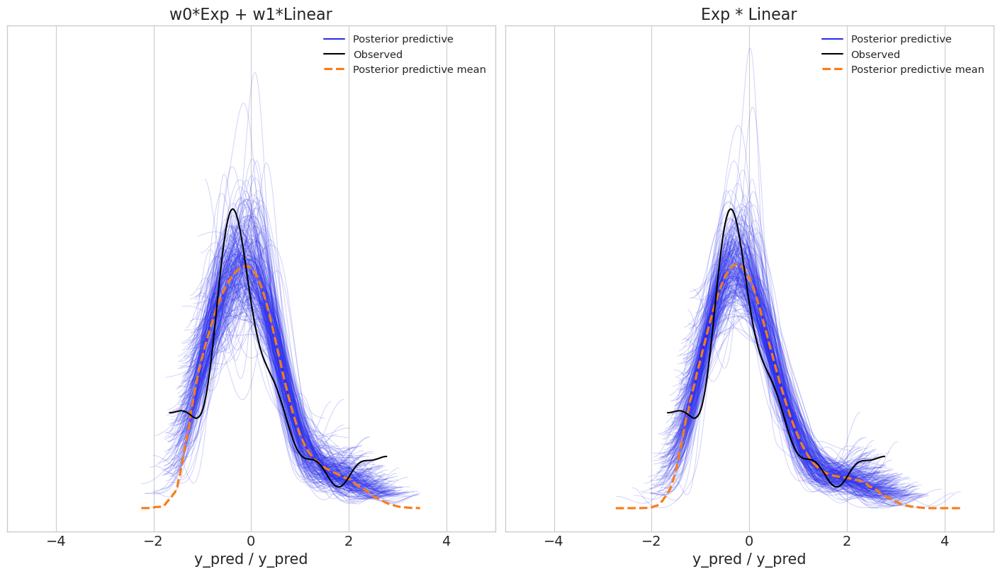

In [110]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
ax1.set_title('w0*Exp + w1*Linear')
ax2.set_title('Exp * Linear')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['exp_linear_weighted']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax2)
ax1.set_xlim((-5, 5))
plt.plot()
plt.show()

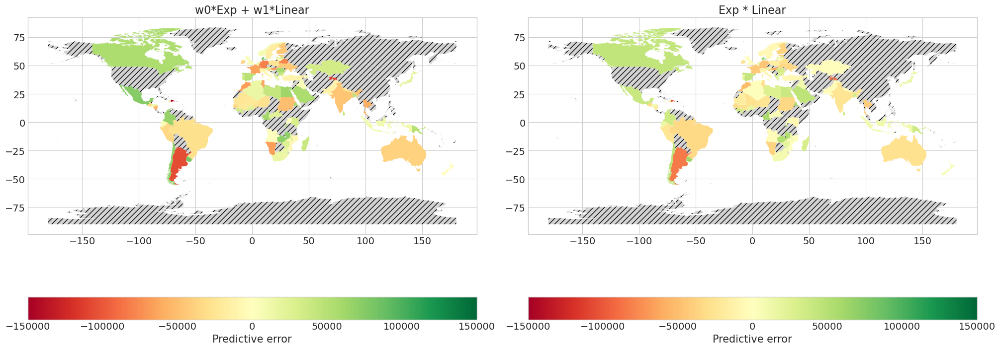

In [111]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 20))
ax1.set_title('w0*Exp + w1*Linear')
ax2.set_title('Exp * Linear')
world_error_plot(world, results['exp_linear_weighted']['pred_samples'], y_mean, y_stddev, y_data, axes=ax1, max_error=150_000)
world_error_plot(world, pred_samples, y_mean, y_stddev, y_data, axes=ax2, max_error=150_000)
plt.show()

In [112]:
results['matern32_linear_mul'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

## All features

Let's try now considering all the features

### Realoding dataset without removing features

In [127]:
# Load the dataset
cy = pd.read_csv('data/yield_processed.csv', index_col=0)
cy = cy[cy['Item'] == 'Potatoes'].drop(columns='Item').reset_index(drop=True)

# Get geodata for plot world map
countries = cy['Area'].unique()
world = get_geodata(countries)

# Get the features and the target feature
cy = cy.drop('Area', axis=1)
print(cy.describe())
x_data = cy.drop('hg/ha_yield', axis=1).to_numpy()
y_data = cy['hg/ha_yield'].to_numpy()

# Set the indices of the sample for testing
num_test_results = 10
test_indices = np.random.choice(len(y_data), size=num_test_results, replace=False)
test_indices = np.sort(test_indices)
train_indices = np.array([i for i in range(len(y_data)) if i not in test_indices])

# Standardize the data
x_std_data, x_mean, x_stddev = standardize_data(x_data)
y_std_data, y_mean, y_stddev = standardize_data(y_data)

# Get 10 samples to plot
x_test_std_data, y_test_std_data = x_std_data[test_indices], y_std_data[test_indices]

y_data_full = y_data.copy()
x_test_data, y_test_data = x_data[test_indices], y_data[test_indices]

n_samples, n_features = x_std_data.shape
x_std_data.shape, y_std_data.shape, x_test_std_data.shape, y_test_std_data.shape

         hg/ha_yield  avg_rain_mm_per_year  pesticides_kg_per_ha   avg_temp  \
count      95.000000             95.000000             95.000000  95.000000   
mean   181841.413334           1019.326316              3.143013  17.850083   
std     96668.731420            696.800613              4.049940   7.388661   
min     20516.217391             51.000000              0.003028   3.459565   
25%    127517.738095            577.000000              0.217843  10.646667   
50%    160965.434783            788.000000              1.590888  18.163478   
75%    224914.108696           1492.500000              4.085821  24.843652   
max    448891.538462           3240.000000             20.888427  29.718696   

             lat         lon         elev  
count  95.000000   95.000000    95.000000  
mean   21.398688   15.279380   637.568421  
std    27.141268   54.357624   586.573509  
min   -41.000000 -102.000000    28.000000  
25%     2.500000   -3.000000   297.500000  
50%    25.000000   20.00

((95, 6), (95,), (10, 6), (10,))

### Rebuild the model
Same model as the last one, with *Exponential kernel * Linear*

In [128]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    c = pm.Normal('c', 0, 8, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.Exponential(n_features, ls=ls) * \
        pm.gp.cov.Linear(n_features, c=c) + \
        pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [129]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True,
        target_accept=0.9
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, c, ls]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 2047 seconds.


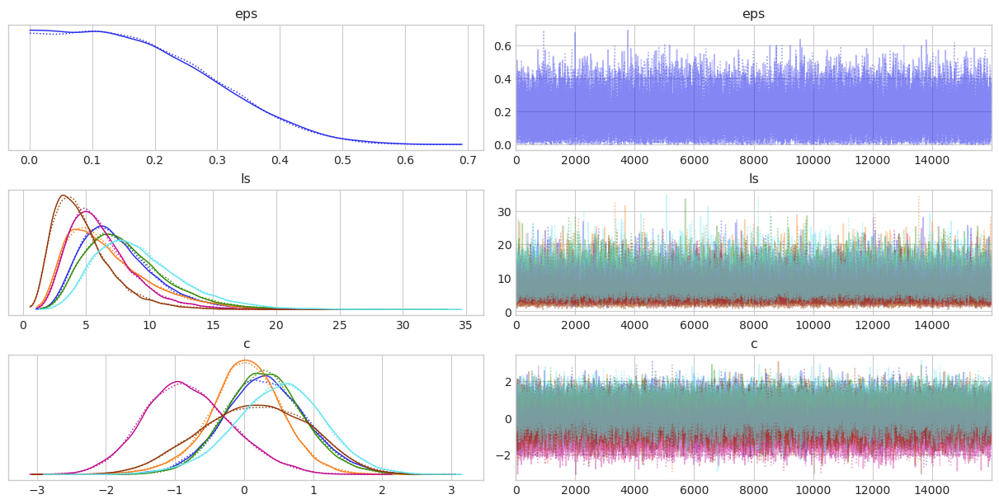

In [130]:
plot_trace(trace, ['eps', 'ls', 'c'])

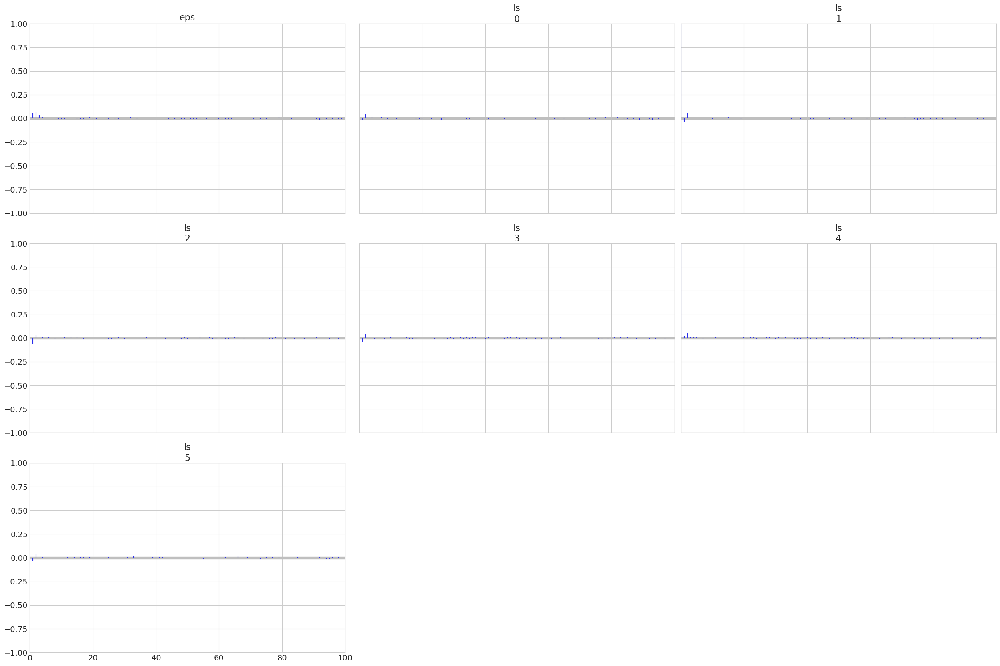

In [131]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [132]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

C:\Users\pasqu\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


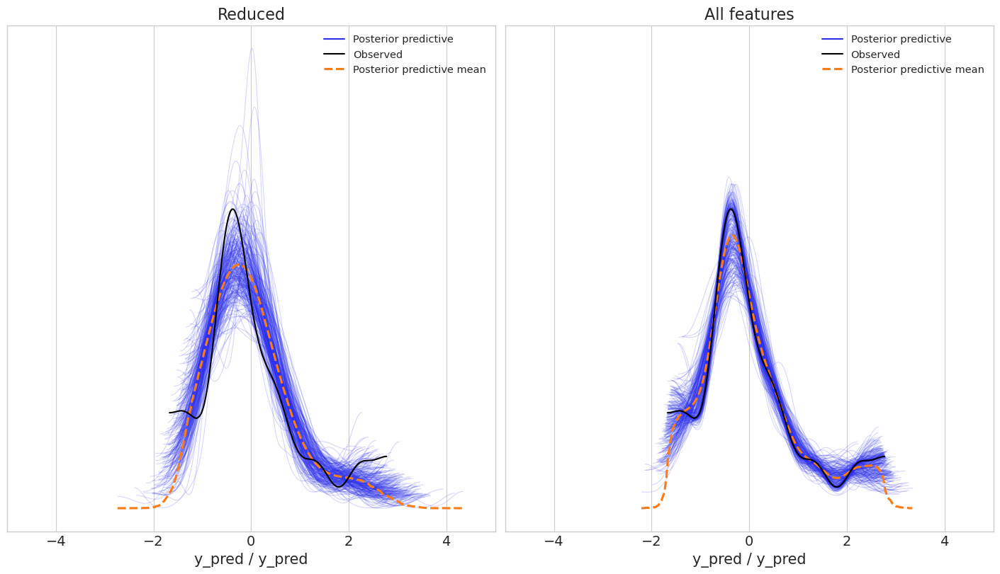

In [133]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
ax1.set_title('Reduced')
ax2.set_title('All features')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['exp_linear_mul']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax2)
ax1.set_xlim((-5, 5))
plt.plot()
plt.show()

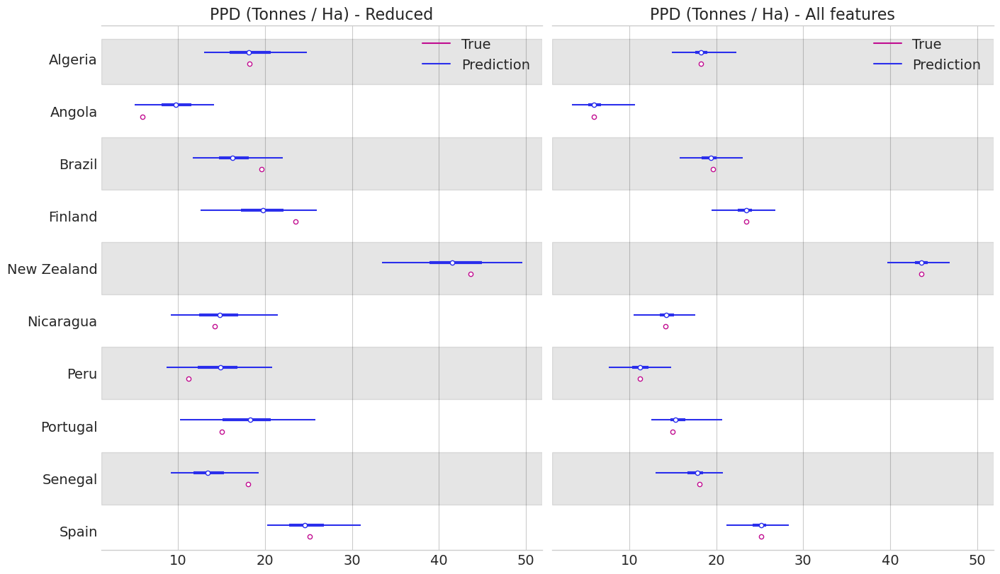

In [134]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['exp_linear_mul']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='PPD (Tonnes / Ha) - Reduced')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='PPD (Tonnes / Ha) - All features')
plt.show()

In [135]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data, show=False)
print("Reduced     : R2: {} \t MAE: {}".format(results['exp_linear_weighted']['r2'], results['exp_linear_mul']['mae']))
print("All features: R2: {} \t MAE: {}".format(r2, mae))

Reduced     : R2: 0.7587010777880591 	 MAE: 27725.795550085248
All features: R2: 0.9995022903343721 	 MAE: 1481.9256912321391


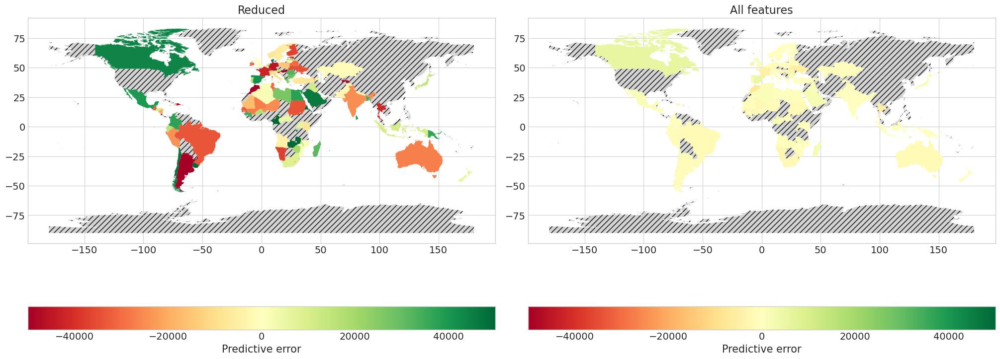

In [136]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 20))
ax1.set_title('Reduced')
ax2.set_title('All features')
world_error_plot(world, results['exp_linear_mul']['pred_samples'], y_mean, y_stddev, y_data, axes=ax1, max_error=50_000)
world_error_plot(world, pred_samples, y_mean, y_stddev, y_data, axes=ax2, max_error=50_000)
plt.show()

In [137]:
results['all_exp_linear'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

### More samples

In [140]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    c = pm.Normal('c', 0, 8, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.Exponential(n_features, ls=ls) * \
        pm.gp.cov.Linear(n_features, c=c) + \
        pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [141]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=32_000, tune=16_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True,
        target_accept=0.9
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, c, ls]


Sampling 2 chains for 16_000 tune and 32_000 draw iterations (32_000 + 64_000 draws total) took 4168 seconds.


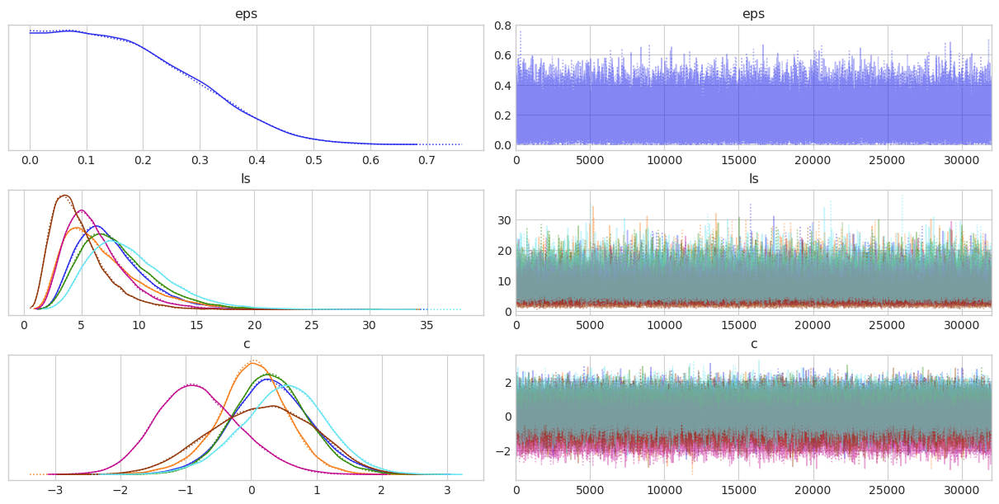

In [142]:
plot_trace(trace, ['eps', 'ls', 'c'])

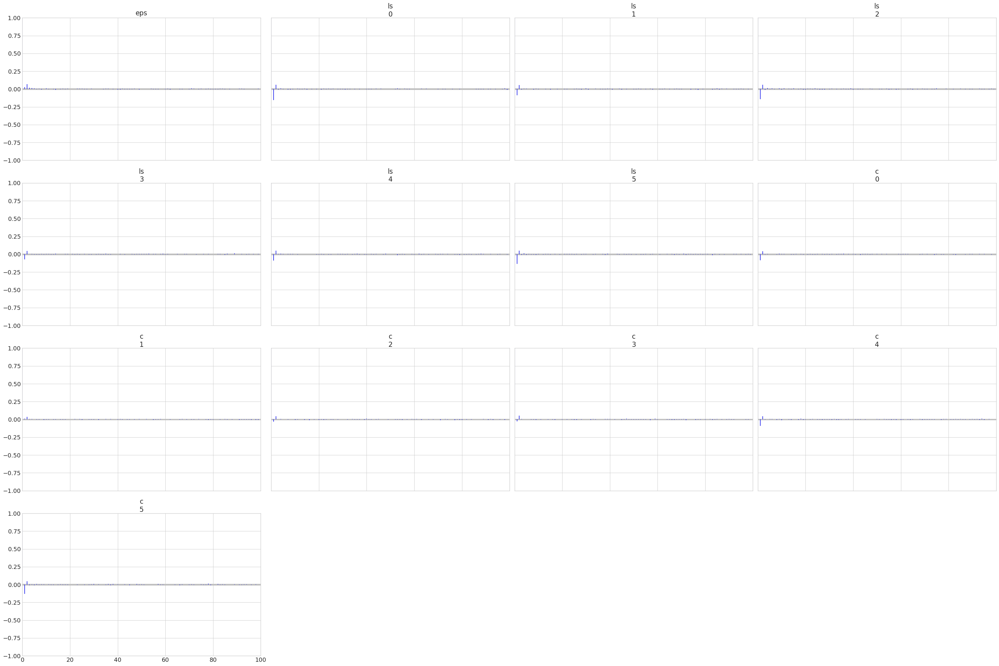

In [143]:
az.plot_autocorr(trace, var_names=['eps', 'ls', 'c'], combined=True)
plt.show()

In [144]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

C:\Users\pasqu\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


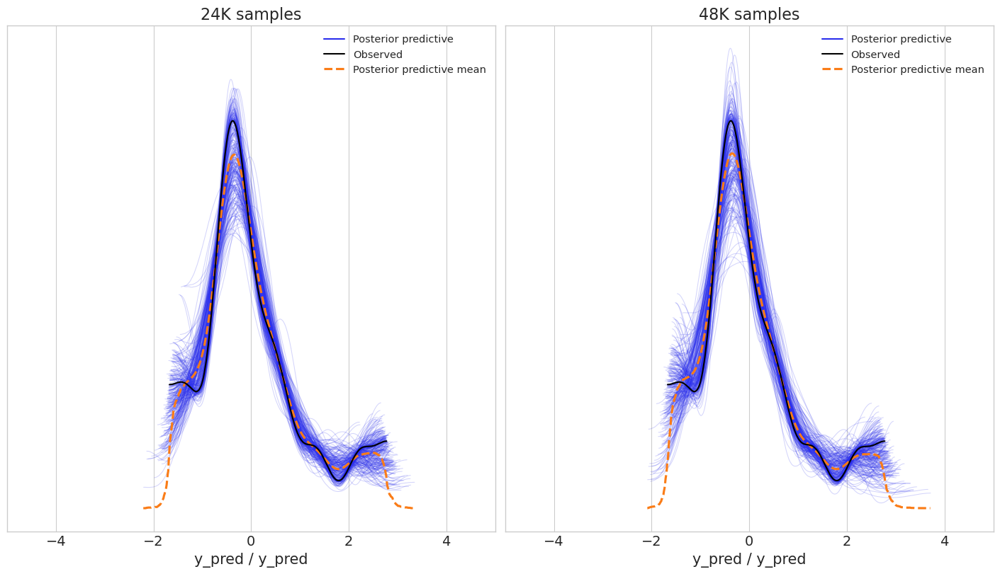

In [145]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
ax1.set_title('24K samples')
ax2.set_title('48K samples')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['all_exp_linear']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax2)
ax1.set_xlim((-5, 5))
plt.plot()
plt.show()

In [146]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data, show=False)
print("24K samples: R2: {} \t MAE: {}".format(results['all_exp_linear']['r2'], results['all_exp_linear']['mae']))
print("48K samples: R2: {} \t MAE: {}".format(r2, mae))

24K samples: R2: 0.9995022903343721 	 MAE: 1481.9256912321391
48K samples: R2: 0.9994061610232478 	 MAE: 1690.4417681353987


In [147]:
results['all_exp_linear2'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

## Removing Data Outliers (based on Pesticides Skewness)

In [154]:
# Set random seed
np.random.seed(42)

# Load the dataset
cy = pd.read_csv('data/yield_processed.csv', index_col=0)
cy = cy[cy['Item'] == 'Potatoes'].drop(columns='Item').reset_index(drop=True)

# Remove countries having pesticides usage lower than the first quartile
q = cy.quantile(0.25)['pesticides_kg_per_ha']
print("Removing samples having Pesticides (Kg/Ha) lower than {:.3f}\n".format(q))
cy = cy[cy['pesticides_kg_per_ha'] > q].reset_index()

# Get geodata for plot world map
countries = cy['Area'].unique()
world = get_geodata(countries)

# Get the features and the target feature
cy = cy.drop('Area', axis=1)
print(cy.describe())
x_data = cy.drop('hg/ha_yield', axis=1).to_numpy()
y_data = cy['hg/ha_yield'].to_numpy()

# Set the indices of the sample for testing
num_test_results = 8
test_indices = np.random.choice(len(y_data), size=num_test_results, replace=False)
test_indices = np.sort(test_indices)
train_indices = np.array([i for i in range(len(y_data)) if i not in test_indices])

# Standardize the data
x_std_data, x_mean, x_stddev = standardize_data(x_data)
y_std_data, y_mean, y_stddev = standardize_data(y_data)

# Get 10 samples to plot
x_test_std_data, y_test_std_data = x_std_data[test_indices], y_std_data[test_indices]

y_data_full = y_data.copy()
x_test_data, y_test_data = x_data[test_indices], y_data[test_indices]

n_samples, n_features = x_std_data.shape
x_std_data.shape, y_std_data.shape, x_test_std_data.shape, y_test_std_data.shape

Removing samples having Pesticides (Kg/Ha) lower than 0.218

           index    hg/ha_yield  avg_rain_mm_per_year  pesticides_kg_per_ha  \
count  71.000000      71.000000             71.000000             71.000000   
mean   47.070423  209207.604397            992.732394              4.171597   
std    28.289485   92567.323537            674.342303              4.216158   
min     0.000000   75126.304348             51.000000              0.227468   
25%    23.500000  144101.136646            590.000000              1.170934   
50%    45.000000  182060.304348            703.000000              2.737318   
75%    72.500000  245124.804348           1449.500000              6.262172   
max    94.000000  448891.538462           3240.000000             20.888427   

        avg_temp        lat         lon         elev  
count  71.000000  71.000000   71.000000    71.000000  
mean   15.935264  26.853878   11.358560   590.591549  
std     7.166818  27.552086   57.150321   538.407243  
min    

((71, 7), (71,), (8, 7), (8,))

In [155]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    c = pm.Normal('c', 0, 8, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.Exponential(n_features, ls=ls) * \
        pm.gp.cov.Linear(n_features, c=c) + \
        pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [156]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True,
        target_accept=0.9
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, c, ls]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 1018 seconds.


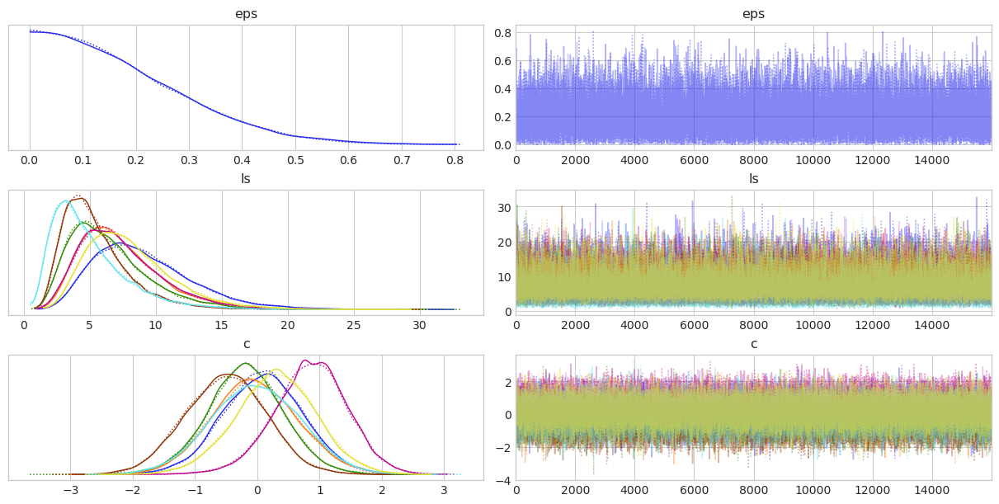

In [157]:
plot_trace(trace, ['eps', 'ls', 'c'])

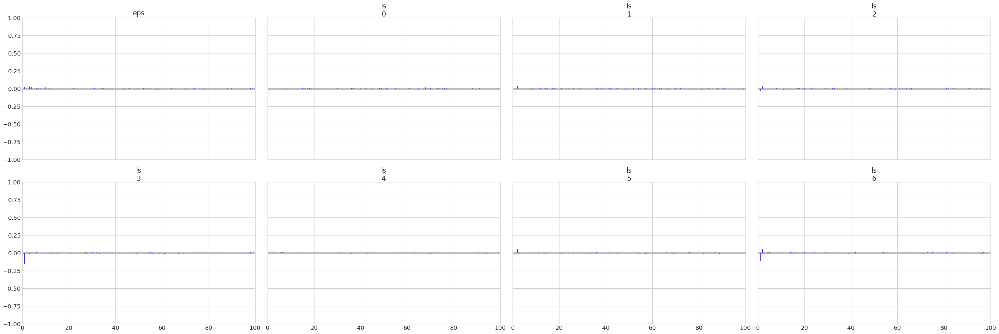

In [158]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [159]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred')

C:\Users\pasqu\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


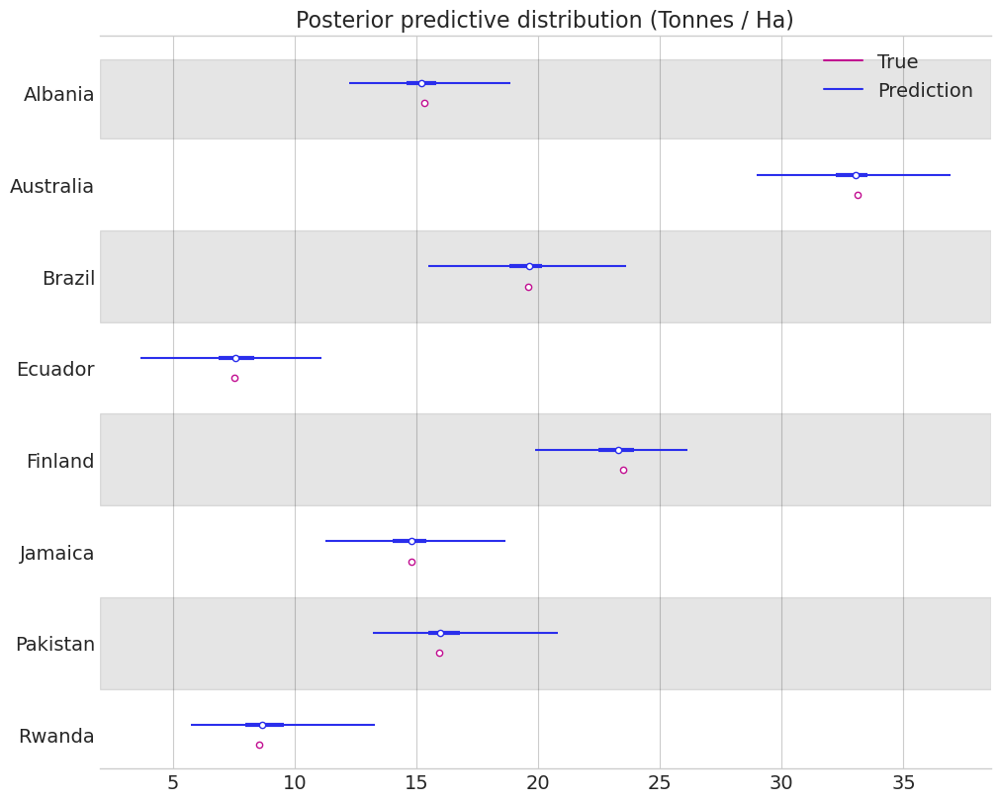

In [160]:
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices])

In [161]:
mae, r2 = compute_metrics(pred_samples, y_mean, y_stddev, y_data)

R2 : 0.9998723954390604
MAE: 805.4517282960298


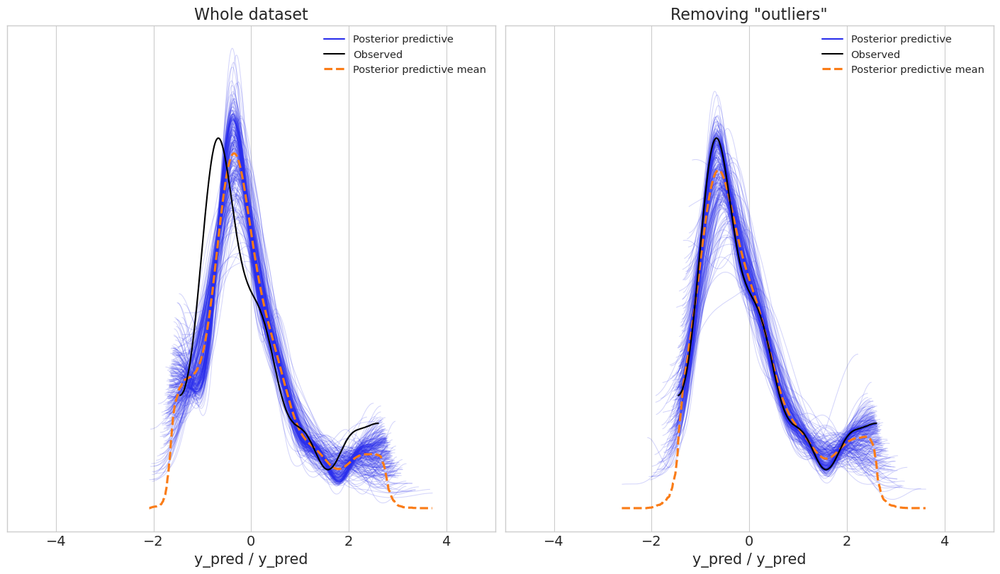

In [162]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
ax1.set_title('Whole dataset')
ax2.set_title('Removing "outliers"')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['all_exp_linear2']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=256, ax=ax2)
ax1.set_xlim((-5, 5))
plt.plot()
plt.show()

In [163]:
results['out_exp_linear'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

## Save and load results

In [12]:
# Load results
with open('yp_potato.pickle', 'rb') as handle:
    results = pickle.load(handle)

In [165]:
# Save results
with open('yp_potato.pickle', 'wb') as handle:
    pickle.dump(results, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [80]:
rs = results['matern32']
trace = rs['trace']
pred_samples = rs['pred_samples']
mae = rs['mae']
r2 = rs['r2']

In [164]:
results.keys()

dict_keys(['expquad1', 'expquad2', 'expquad3', 'expquad4', 'poly', 'exp', 'exp_linear_sum', 'exp_linear_weighted', 'exp_linear_mul', 'all_exp_linear', 'all_exp_linear2', 'out_exp_linear'])

In [ ]:
rs = results['all_exp_linear2']
trace = rs['trace']
pred_samples = rs['pred_samples']
mae = rs['mae']
r2 = rs['r2']